## Part 0

Study the evolution over time of the min, max and average temperatures computed over one month.


In [13]:
# Import all the necessary libaries
library(ggplot2)
library(dplyr)
library(tidyr)
library(extraDistr)     # for rcauchy
library(posterior)      # for posterior samples
library(gridExtra)      # for arranging plots
library(scales)
library(reshape2)
library(brms)


In [14]:
# Load the CSV files
A <- read.csv("AuronzoDiCadore.csv")
C <- read.csv("CastelfrancoVeneto.csv")
P <- read.csv("PortoTolle.csv")
R <- read.csv("Roverchiara.csv")

# first remove eventual missing values/ NA


A <- drop_na(A, Min, Avg, Max)
C <- drop_na(C, Min, Avg, Max)
P <- drop_na(P, Min, Avg, Max)
R <- drop_na(R, Min, Avg, Max)


In [15]:
tail(A); head(C); head(P); head(R)


,Year,Month,Min,Avg,Max
,<int>,<int>,<dbl>,<dbl>,<dbl>
355,2023,7,11.6,17.7,25.4
356,2023,8,11.3,17.4,25.3
357,2023,9,8.6,14.7,23.1
358,2023,10,5.7,10.4,16.7
359,2023,11,-2.1,1.5,7.1
360,2023,12,-4.0,-1.0,3.3


,Year,Month,Min,Avg,Max
,<int>,<int>,<dbl>,<dbl>,<dbl>
1,1994,1,-0.5,4.1,9.6
2,1994,2,-1.4,3.3,8.5
3,1994,3,4.1,10.3,16.9
4,1994,4,5.6,11.2,16.3
5,1994,5,11.5,17.2,22.6
6,1994,6,14.9,20.9,27.3


,Year,Month,Min,Avg,Max
,<int>,<int>,<dbl>,<dbl>,<dbl>
1,1994,1,0.8,4.6,8.6
2,1994,2,1.0,4.7,8.5
3,1994,3,5.0,10.5,16.7
4,1994,4,7.4,11.8,16.4
5,1994,5,11.7,17.2,21.9
6,1994,6,15.8,21.0,26.0


,Year,Month,Min,Avg,Max
,<int>,<int>,<dbl>,<dbl>,<dbl>
1,1994,1,0.4,4.0,8.8
2,1994,2,0.0,3.9,8.4
3,1994,3,4.0,10.7,18.3
4,1994,4,5.6,11.2,17.0
5,1994,5,10.8,17.3,23.1
6,1994,6,14.0,20.9,27.6


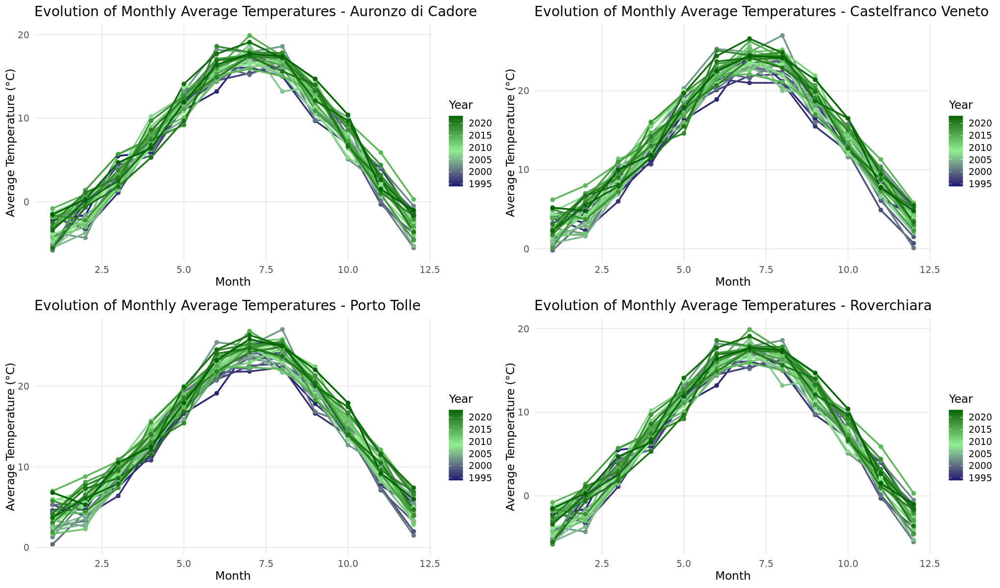

In [16]:
# Plot With a color gradient the evolution of the avg temperatures over the year

A <- A %>% arrange(Year, Month)
C <- C %>% arrange(Year, Month)
P <- P %>% arrange(Year, Month)
R <- R %>% arrange(Year, Month)

# Plot
p1 <- ggplot(A, aes(x = Month, y = Avg, group = Year, color = Year)) +
  geom_line(size = 1) +
  geom_point(size = 2) +
  scale_color_gradientn(
  colors = c("midnightblue", "lightgreen", "darkgreen"),
  name = "Year"
) +
  labs(
    title = "Evolution of Monthly Average Temperatures - Auronzo di Cadore",
    x = "Month",
    y = "Average Temperature (°C)"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.background = element_rect(fill = "white", color = NA),
    panel.grid.minor = element_blank()
  )

p2 <- ggplot(C, aes(x = Month, y = Avg, group = Year, color = Year)) +
  geom_line(size = 1) +
  geom_point(size = 2) +
  scale_color_gradientn(
  colors = c("midnightblue", "lightgreen", "darkgreen"),
  name = "Year"
) +
  labs(
    title = "Evolution of Monthly Average Temperatures - Castelfranco Veneto",
    x = "Month",
    y = "Average Temperature (°C)"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.background = element_rect(fill = "white", color = NA),
    panel.grid.minor = element_blank()
  )


p3 <- ggplot(P, aes(x = Month, y = Avg, group = Year, color = Year)) +
  geom_line(size = 1) +
  geom_point(size = 2) +
  scale_color_gradientn(
  colors = c("midnightblue", "lightgreen", "darkgreen"),
  name = "Year"
) +
  labs(
    title = "Evolution of Monthly Average Temperatures - Porto Tolle",
    x = "Month",
    y = "Average Temperature (°C)"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.background = element_rect(fill = "white", color = NA),
    panel.grid.minor = element_blank()
  )


p4 <- ggplot(A, aes(x = Month, y = Avg, group = Year, color = Year)) +
  geom_line(size = 1) +
  geom_point(size = 2) +
  scale_color_gradientn(
  colors = c("midnightblue", "lightgreen", "darkgreen"),
  name = "Year"
) +
  labs(
    title = "Evolution of Monthly Average Temperatures - Roverchiara",
    x = "Month",
    y = "Average Temperature (°C)"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.background = element_rect(fill = "white", color = NA),
    panel.grid.minor = element_blank()
  )
  
options(repr.plot.width = 17, repr.plot.height = 10)
# Arrange all four plots in 2 rows, 2 columns
grid.arrange(p1, p2,
             p3, p4,
             ncol = 2)


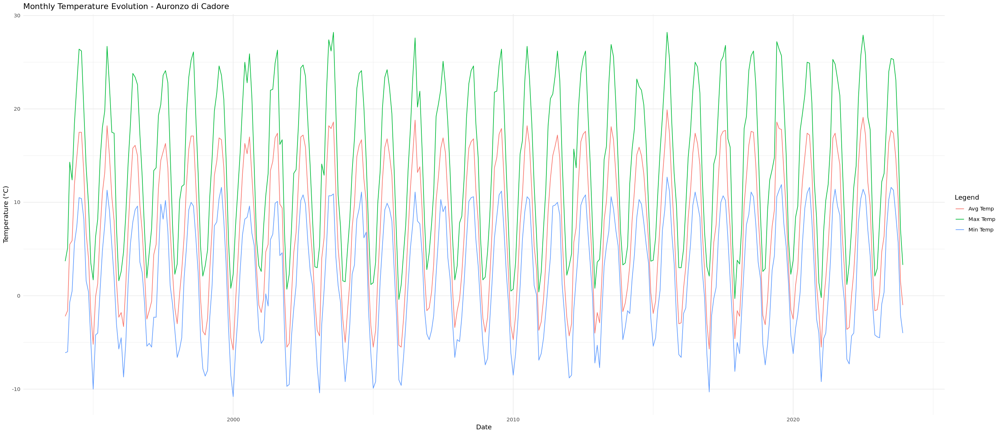

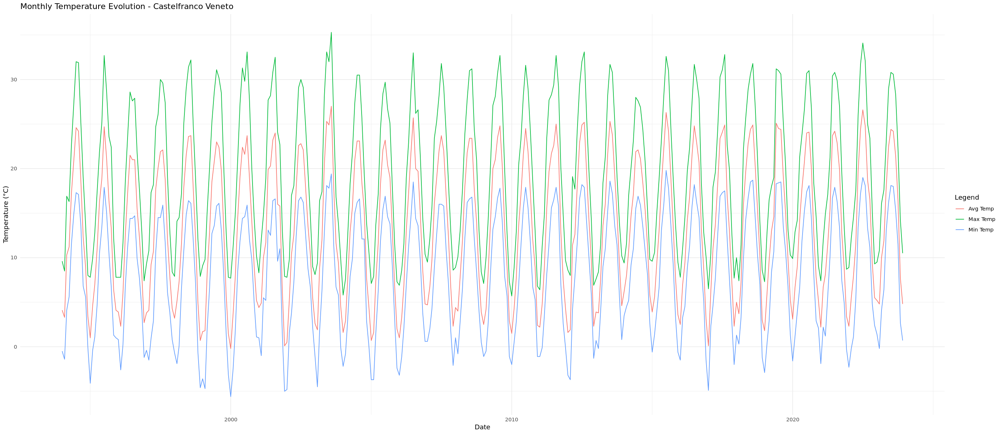

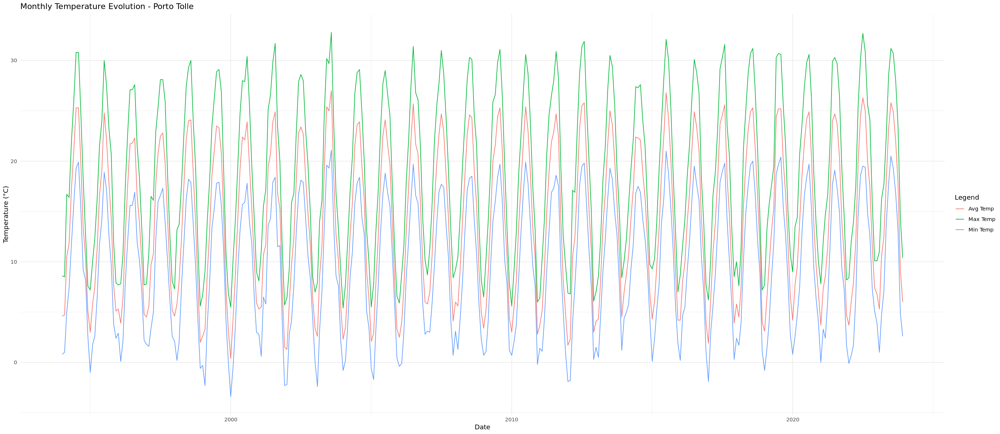

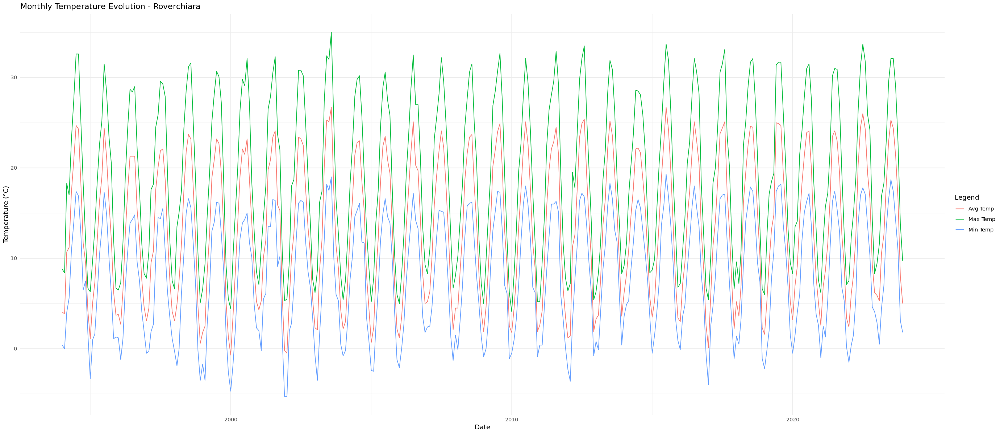

In [17]:
A$Date <- as.Date(paste(A$Year, A$Month, "01", sep = "-"), format = "%Y-%m-%d")
A <- A[order(A$Date), ]
C$Date <- as.Date(paste(C$Year, C$Month, "01", sep = "-"), format = "%Y-%m-%d")
C <- C[order(C$Date), ]
P$Date <- as.Date(paste(P$Year, P$Month, "01", sep = "-"), format = "%Y-%m-%d")
P <- P[order(P$Date), ]
R$Date <- as.Date(paste(R$Year, R$Month, "01", sep = "-"), format = "%Y-%m-%d")
R <- R[order(R$Date), ]

options(repr.plot.width = 23, repr.plot.height = 10)

ggplot(A, aes(x = Date)) +
  geom_line(aes(y = Max, color = "Max Temp")) +
  geom_line(aes(y = Min, color = "Min Temp")) +
  geom_line(aes(y = Avg, color = "Avg Temp")) +
  labs(title = "Monthly Temperature Evolution - Auronzo di Cadore",
       x = "Date",
       y = "Temperature (°C)",
       color = "Legend") +
  theme_minimal()


ggplot(C, aes(x = Date)) +
  geom_line(aes(y = Max, color = "Max Temp")) +
  geom_line(aes(y = Min, color = "Min Temp")) +
  geom_line(aes(y = Avg, color = "Avg Temp")) +
  labs(title = "Monthly Temperature Evolution - Castelfranco Veneto",
       x = "Date",
       y = "Temperature (°C)",
       color = "Legend") +
  theme_minimal()


ggplot(P, aes(x = Date)) +
  geom_line(aes(y = Max, color = "Max Temp")) +
  geom_line(aes(y = Min, color = "Min Temp")) +
  geom_line(aes(y = Avg, color = "Avg Temp")) +
  labs(title = "Monthly Temperature Evolution - Porto Tolle",
       x = "Date",
       y = "Temperature (°C)",
       color = "Legend") +
  theme_minimal()


ggplot(R, aes(x = Date)) +
  geom_line(aes(y = Max, color = "Max Temp")) +
  geom_line(aes(y = Min, color = "Min Temp")) +
  geom_line(aes(y = Avg, color = "Avg Temp")) +
  labs(title = "Monthly Temperature Evolution - Roverchiara",
       x = "Date",
       y = "Temperature (°C)",
       color = "Legend") +
  theme_minimal()



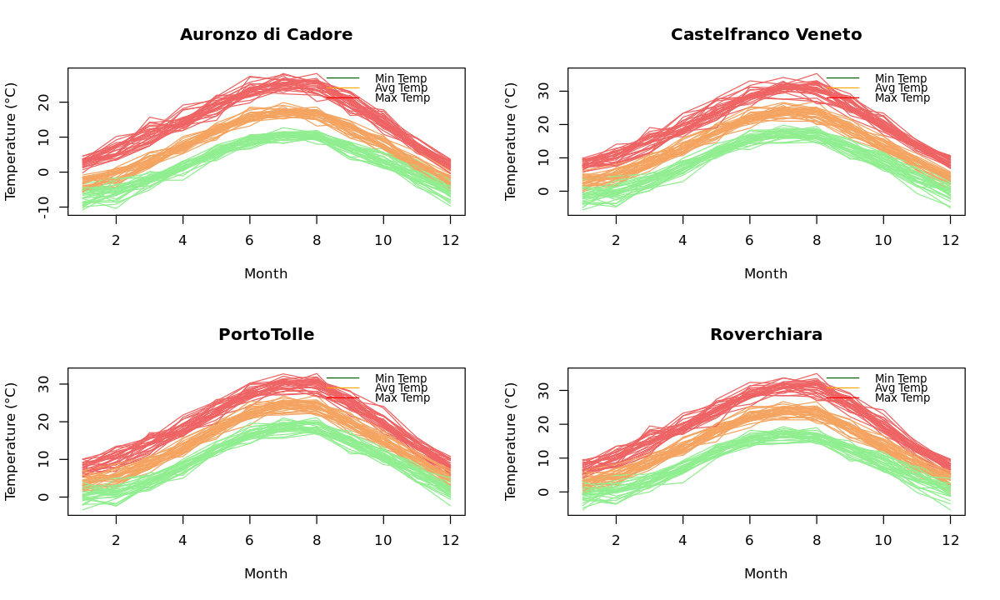

In [43]:
# Set white background
par(bg = "white")

# Split plotting area into 2 rows x 2 columns
par(mfrow = c(2, 2))

# Function to plot one city's data
plot_city <- function(df, city_name) {
  plot(1, type = "n", xlim = c(1, 12),
       ylim = range(c(df$Min, df$Avg, df$Max), na.rm = TRUE),
       xlab = "Month", ylab = "Temperature (°C)",
       main = paste(city_name))
  
  years <- sort(unique(df$Year))
  
  for (year in years) {
    data_year <- df[df$Year == year, ]
    lines(data_year$Month, data_year$Min, col = "lightgreen")
    lines(data_year$Month, data_year$Avg, col = "sandybrown")
    lines(data_year$Month, data_year$Max, col = "indianred2")
  }
  
  legend("topright", legend = c("Min Temp", "Avg Temp", "Max Temp"),
         col = c("darkgreen", "orange", "red"), lty = 1, bty = "n", cex = 0.8)
}

# Call the function for each city dataframe
options(repr.plot.width = 10, repr.plot.height = 6)

plot_city(A, "Auronzo di Cadore")
plot_city(C, "Castelfranco Veneto")
plot_city(P, "PortoTolle")
plot_city(R, "Roverchiara")


After studying visually how the temperatures behaves over time we now proceed to compute statistical data such as the mean, the minimum and the maximum temperature for the sets of temperatures.

In [19]:
info <- function(df, city_name) {
  # Calcolo delle statistiche
  avgmin <- mean(df[["Min"]])
  avgavg <- mean(df[["Avg"]])
  avgmax <- mean(df[["Max"]])

  minmin <- min(df[["Min"]])
  minavg <- min(df[["Avg"]])
  minmax <- min(df[["Max"]])

  maxmin <- max(df[["Min"]])
  maxavg <- max(df[["Avg"]])
  maxmax <- max(df[["Max"]])

  result <- data.frame(
    "Monthly Max" = c(avgmax, minmax, maxmax),
    "Monthly Min" = c(avgmin, minmin, maxmin),
    "Monthly Avg" = c(avgavg, minavg, maxavg),
    row.names = c("Mean", "Minimum", "Maximum")
  )
  cat("\n", city_name, ":\n")
  result
}

info(A, "Auronzo di Cadore")
info(C, "Castelfranco Veneto")
info(P, "PortoTolle")
info(R, "Roverchiara")



 Auronzo di Cadore :


,Monthly.Max,Monthly.Min,Monthly.Avg
,<dbl>,<dbl>,<dbl>
Mean,14.15667,2.069167,7.288056
Minimum,-0.40000,-10.800000,-5.800000
Maximum,28.20000,12.700000,19.900000



 Castelfranco Veneto :


,Monthly.Max,Monthly.Min,Monthly.Avg
,<dbl>,<dbl>,<dbl>
Mean,19.53972,7.906389,13.35722
Minimum,5.70000,-5.600000,-0.20000
Maximum,35.30000,19.800000,27.00000



 PortoTolle :


,Monthly.Max,Monthly.Min,Monthly.Avg
,<dbl>,<dbl>,<dbl>
Mean,18.92167,9.496667,14.08333
Minimum,5.40000,-3.400000,0.40000
Maximum,32.80000,21.100000,27.00000



 Roverchiara :


,Monthly.Max,Monthly.Min,Monthly.Avg
,<dbl>,<dbl>,<dbl>
Mean,19.29667,7.983333,13.43667
Minimum,4.10000,-5.300000,-0.70000
Maximum,35.00000,19.300000,26.70000


## Part 1
Analysis of the evolution of the annual average of the min, max and daily average temperature over time
(1993 - 2021):

In [20]:
glimpse(A)


Rows: 360
Columns: 6
$ Year  <int> 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994…
$ Month <int> 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8, 9…
$ Min   <dbl> -6.1, -6.0, -0.7, 0.5, 5.6, 7.4, 10.5, 10.4, 8.2, 1.6, 0.4, -4.9…
$ Avg   <dbl> -2.2, -1.6, 5.5, 5.9, 11.9, 14.8, 17.5, 17.5, 13.1, 6.7, 4.0, -1…
$ Max   <dbl> 3.7, 5.1, 14.3, 12.4, 18.4, 22.6, 26.4, 26.2, 19.9, 13.8, 9.8, 3…
$ Date  <date> 1994-01-01, 1994-02-01, 1994-03-01, 1994-04-01, 1994-05-01, 199…


In [21]:
# We proceed to create four new dataframes having 28 Rows (From 1993 to 2021), one for each year, 
# where each row contains the average min/avg/max for such year.

A_avg <- A %>% group_by(Year) %>% summarize(Min_mean = mean(Min), Max_mean = mean(Max), Avg_mean = mean(Avg))
glimpse(A_avg)

C_avg <- C %>% group_by(Year) %>% summarize(Min_mean = mean(Min), Max_mean = mean(Max), Avg_mean = mean(Avg))
glimpse(C_avg)

P_avg <- P %>% group_by(Year) %>% summarize(Min_mean = mean(Min), Max_mean = mean(Max), Avg_mean = mean(Avg))
glimpse(P_avg)

R_avg <- R %>% group_by(Year) %>% summarize(Min_mean = mean(Min), Max_mean = mean(Max), Avg_mean = mean(Avg))
glimpse(R_avg)


Rows: 30
Columns: 4
$ Year     <int> 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2…
$ Min_mean <dbl> 2.2416667, 1.1416667, 1.2666667, 1.7083333, 1.2916667, 1.5833…
$ Max_mean <dbl> 14.67500, 13.45833, 13.10000, 14.53333, 14.25000, 13.76667, 1…
$ Avg_mean <dbl> 7.608333, 6.508333, 6.525000, 7.283333, 6.866667, 6.783333, 7…
Rows: 30
Columns: 4
$ Year     <int> 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2…
$ Min_mean <dbl> 7.875000, 6.491667, 6.708333, 6.650000, 6.325000, 6.558333, 7…
$ Max_mean <dbl> 19.25000, 18.54167, 17.77500, 19.48333, 19.58333, 19.94167, 2…
$ Avg_mean <dbl> 13.25833, 12.08333, 12.02500, 12.71667, 12.45000, 12.51667, 1…
Rows: 30
Columns: 4
$ Year     <int> 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2…
$ Min_mean <dbl> 9.675000, 8.358333, 8.716667, 8.891667, 8.541667, 8.650000, 8…
$ Max_mean <dbl> 18.57500, 17.71667, 17.44167, 18.44167, 18.44167, 18.24167, 1…
$ Avg_mean <dbl> 14.08333, 12.93333, 13.07500, 13.57500, 13.

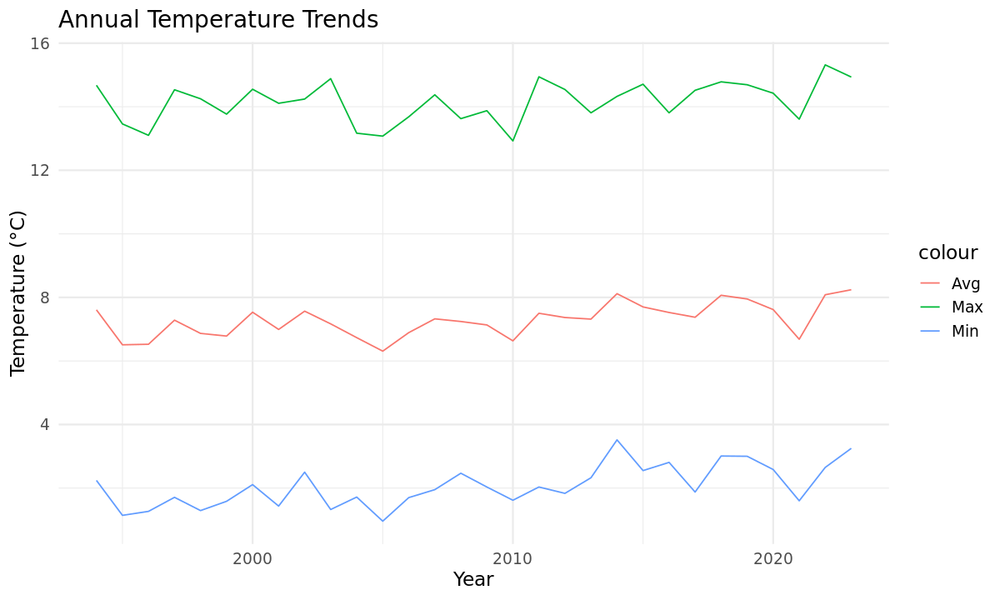

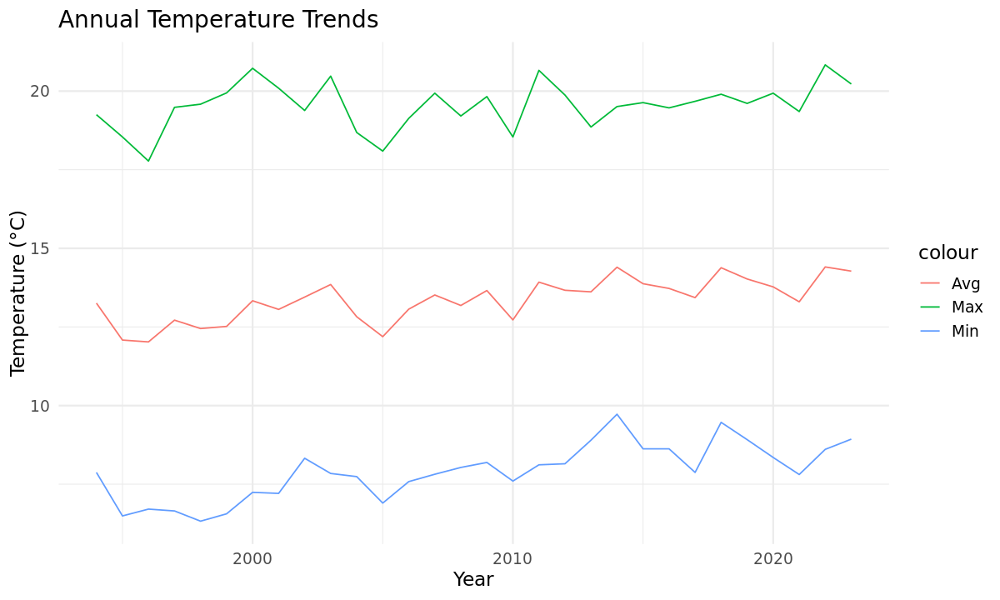

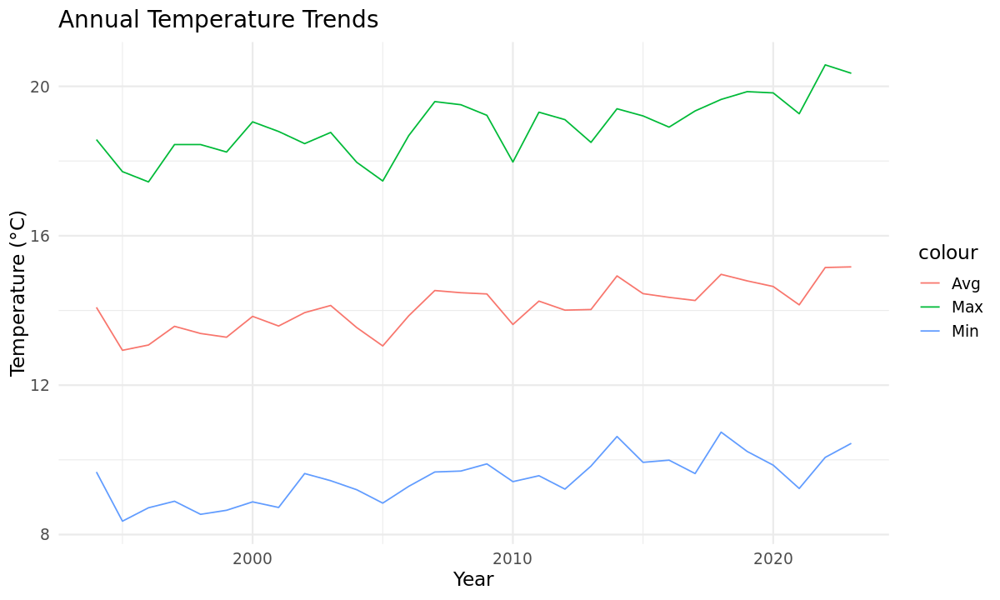

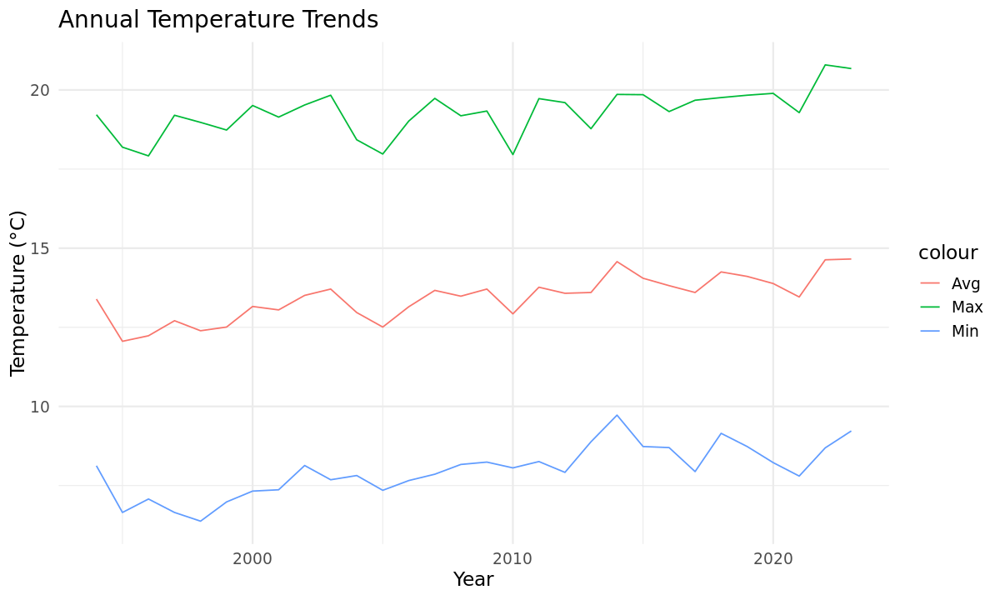

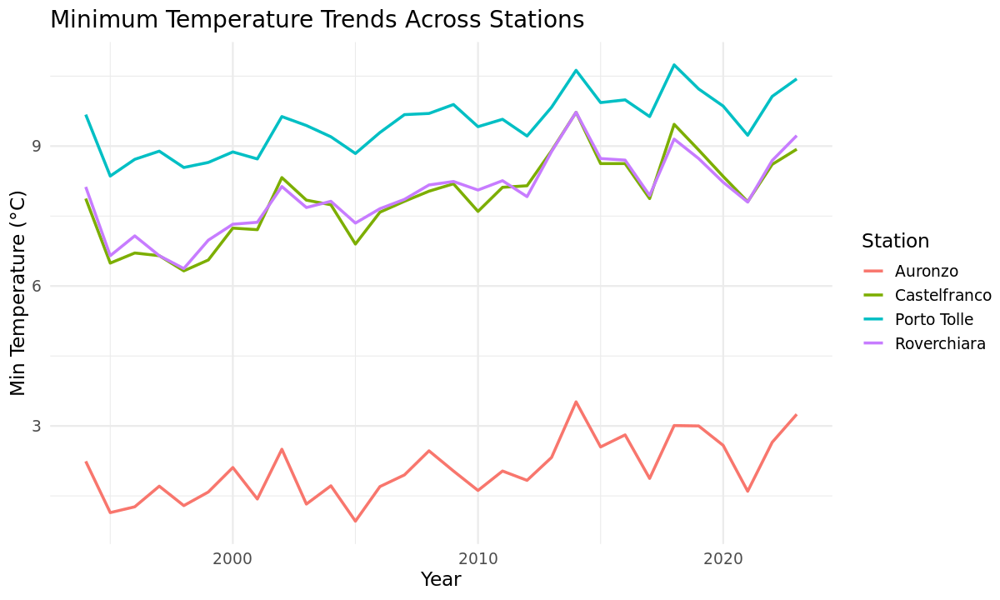

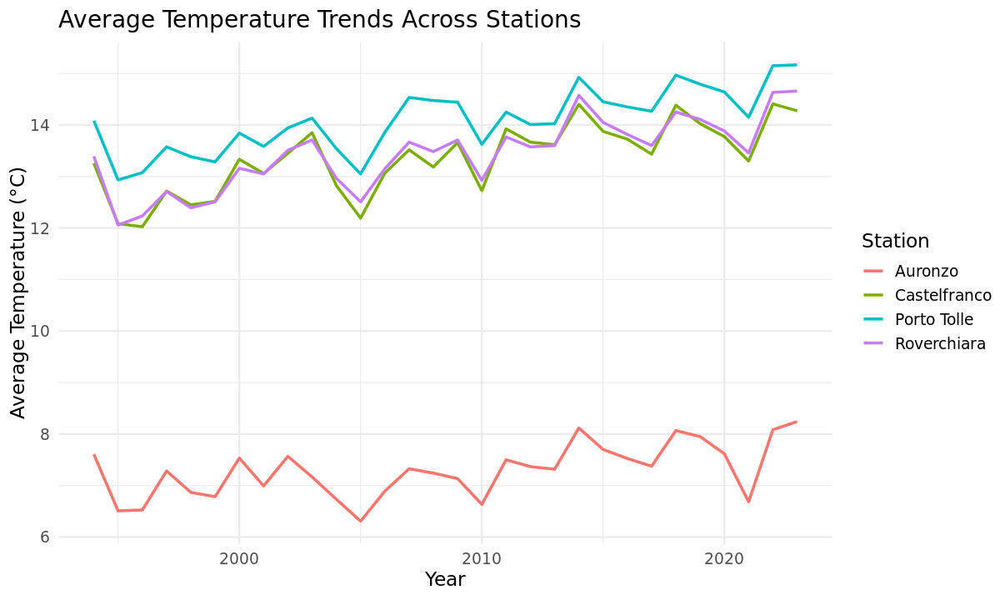

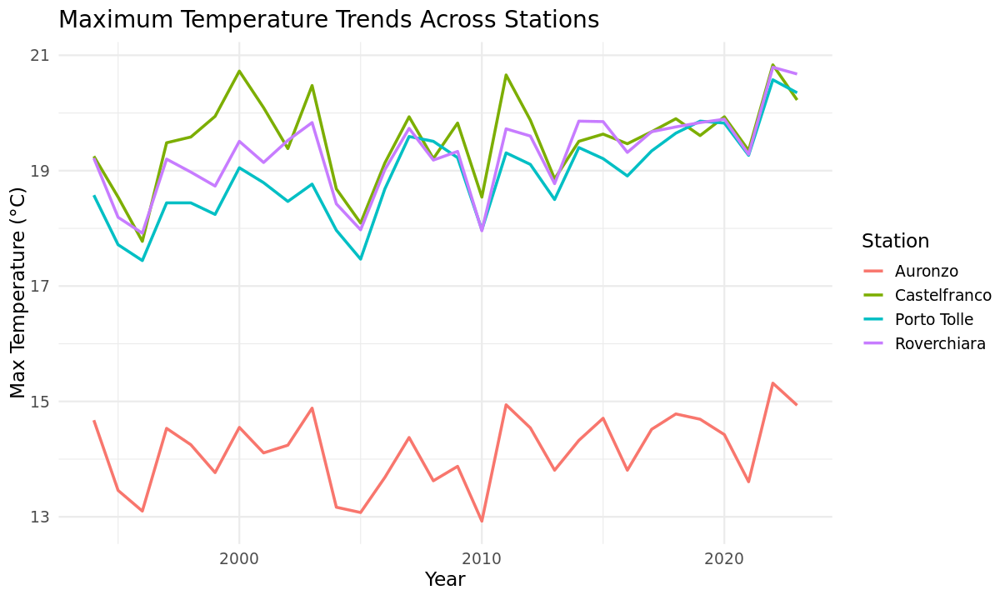

In [44]:
options(repr.plot.width = 10, repr.plot.height = 6)

ggplot(A_avg, aes(x = Year)) +
  geom_line(aes(y = Min_mean, color = "Min")) +
  geom_line(aes(y = Avg_mean, color = "Avg")) +
  geom_line(aes(y = Max_mean, color = "Max")) +
  labs(title = "Annual Temperature Trends", y = "Temperature (°C)")+
  theme_minimal(base_size = 14)
  
ggplot(C_avg, aes(x = Year)) +
  geom_line(aes(y = Min_mean, color = "Min")) +
  geom_line(aes(y = Avg_mean, color = "Avg")) +
  geom_line(aes(y = Max_mean, color = "Max")) +
  labs(title = "Annual Temperature Trends", y = "Temperature (°C)")+
  theme_minimal(base_size = 14)
  
ggplot(P_avg, aes(x = Year)) +
  geom_line(aes(y = Min_mean, color = "Min")) +
  geom_line(aes(y = Avg_mean, color = "Avg")) +
  geom_line(aes(y = Max_mean, color = "Max")) +
  labs(title = "Annual Temperature Trends", y = "Temperature (°C)")+
  theme_minimal(base_size = 14)
  
ggplot(R_avg, aes(x = Year)) +
  geom_line(aes(y = Min_mean, color = "Min")) +
  geom_line(aes(y = Avg_mean, color = "Avg")) +
  geom_line(aes(y = Max_mean, color = "Max")) +
  labs(title = "Annual Temperature Trends", y = "Temperature (°C)")+
  theme_minimal(base_size = 14)

  
# Add station labels
A_avg$Station <- "Auronzo"
C_avg$Station <- "Castelfranco"
P_avg$Station <- "Porto Tolle"
R_avg$Station <- "Roverchiara"

# Combine data
all_data <- bind_rows(A_avg, C_avg, P_avg, R_avg)


# --- Plot 1: Min temperature ---
ggplot(all_data, aes(x = Year, y = Min_mean, color = Station)) +
  geom_line(size = 1) +
  labs(title = "Minimum Temperature Trends Across Stations",
       y = "Min Temperature (°C)",
       color = "Station") +
  theme_minimal(base_size = 14)

# --- Plot 2: Average temperature ---
ggplot(all_data, aes(x = Year, y = Avg_mean, color = Station)) +
  geom_line(size = 1) +
  labs(title = "Average Temperature Trends Across Stations",
       y = "Average Temperature (°C)",
       color = "Station") +
  theme_minimal(base_size = 14)

# --- Plot 3: Max temperature ---
ggplot(all_data, aes(x = Year, y = Max_mean, color = Station)) +
  geom_line(size = 1) +
  labs(title = "Maximum Temperature Trends Across Stations",
       y = "Max Temperature (°C)",
       color = "Station") +
  theme_minimal(base_size = 14)




• Study the trend of the annual averages and compare them with a constant value or a rising trend
(for instance linear or quadratic)

 Basically the Idea here is to compare these annual averages with various behaviour:
 1. Costant Value\
 The Average Temperatures behaves like a constant k + epsilon, where epsilon is some gaussian white noise 
 2. Rising Trend, linear\
 In this case we add a linear term, depending linearly to time.
 3. Rising Trend, quadratic\
 Here we use a quadratic term.

In [23]:
# To do the linear regression we will exploit the R build in function "lm" which does a frequentist regression exploiting the least squares method
# Constant Model
fit_constA <- lm(Avg_mean ~ 1, data = A_avg)
fit_constC <- lm(Avg_mean ~ 1, data = C_avg)
fit_constP <- lm(Avg_mean ~ 1, data = P_avg)
fit_constR <- lm(Avg_mean ~ 1, data = R_avg)

# Linear model
fit_linA <- lm(Avg_mean ~ Year, data = A_avg)
fit_linC <- lm(Avg_mean ~ Year, data = C_avg)
fit_linP <- lm(Avg_mean ~ Year, data = P_avg)
fit_linR <- lm(Avg_mean ~ Year, data = R_avg)

# Quadratic Model
fit_quadA <- lm(Avg_mean ~ poly(Year, 2), data = A_avg)
fit_quadC <- lm(Avg_mean ~ poly(Year, 2), data = C_avg)
fit_quadP <- lm(Avg_mean ~ poly(Year, 2), data = P_avg)
fit_quadR <- lm(Avg_mean ~ poly(Year, 2), data = R_avg)


In [24]:

# Helper function to overlay precomputed model predictions
plot_station_models_using_fits <- function(df, station_name, fit_const, fit_lin, fit_quad) {
  # Generate fitted values
  df$fit_const <- predict(fit_const)
  df$fit_lin   <- predict(fit_lin)
  df$fit_quad  <- predict(fit_quad)

  # Plot
  ggplot(df, aes(x = Year, y = Avg_mean)) +
    geom_point(color = "black", size = 2) +
    geom_line(aes(y = fit_const), color = "gray40", size = 1.2) +
    geom_line(aes(y = fit_lin), color = "blue", size = 1.2) +
    geom_line(aes(y = fit_quad), color = "red", size = 1.2) +
    labs(
      title = paste("Model Comparison -", station_name),
      subtitle = "Gray dashed: Constant | Blue: Linear | Red: Quadratic",
      x = "Year",
      y = "Average Temperature (°C)"
    ) +
    theme_minimal(base_size = 14)
}


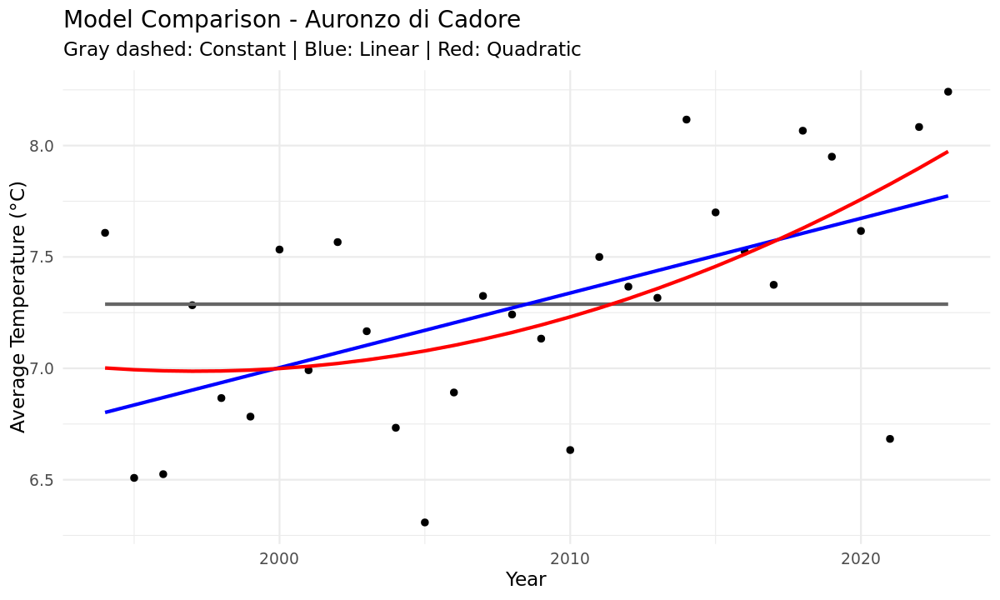

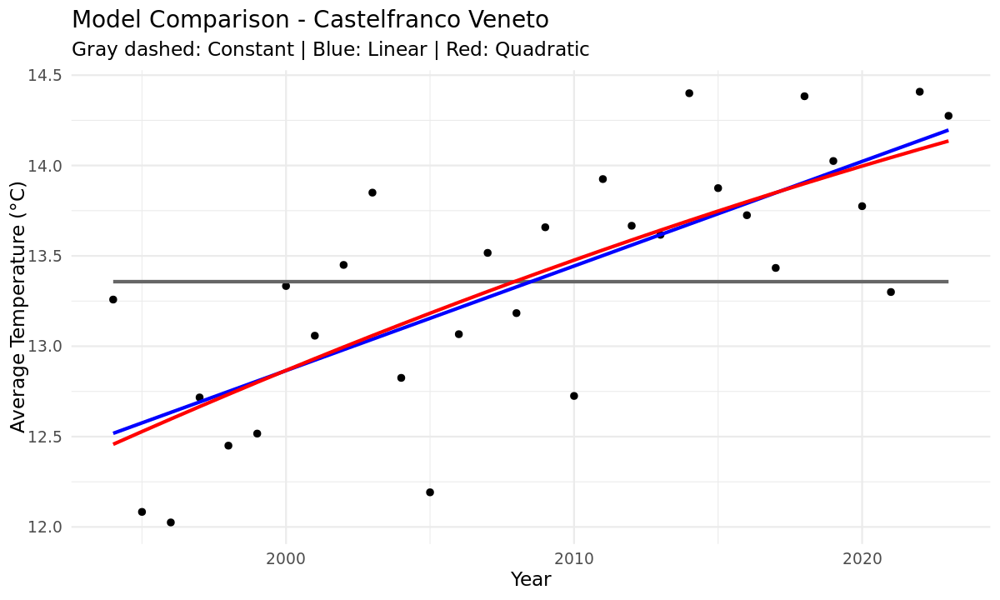

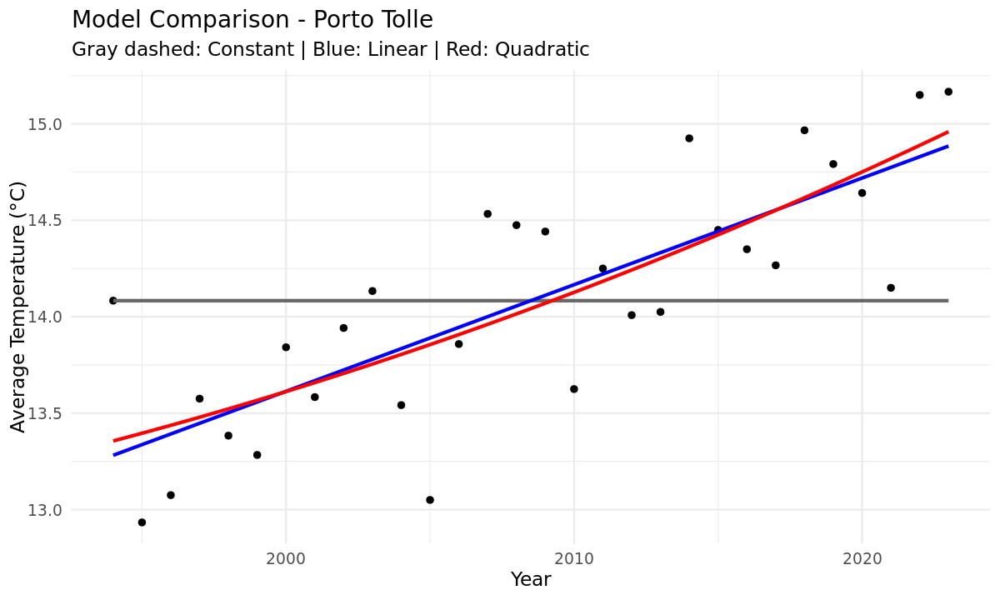

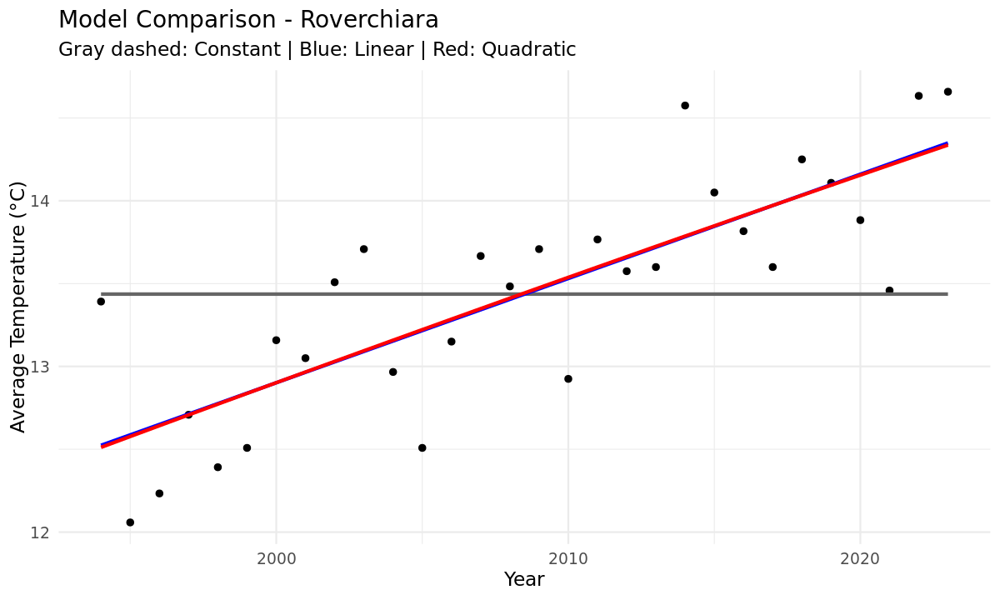

In [25]:
# Auronzo di Cadore
plot_station_models_using_fits(A_avg, "Auronzo di Cadore", fit_constA, fit_linA, fit_quadA)

# Castelfranco Veneto
plot_station_models_using_fits(C_avg, "Castelfranco Veneto", fit_constC, fit_linC, fit_quadC)

# Porto Tolle
plot_station_models_using_fits(P_avg, "Porto Tolle", fit_constP, fit_linP, fit_quadP)

# Roverchiara
plot_station_models_using_fits(R_avg, "Roverchiara", fit_constR, fit_linR, fit_quadR)


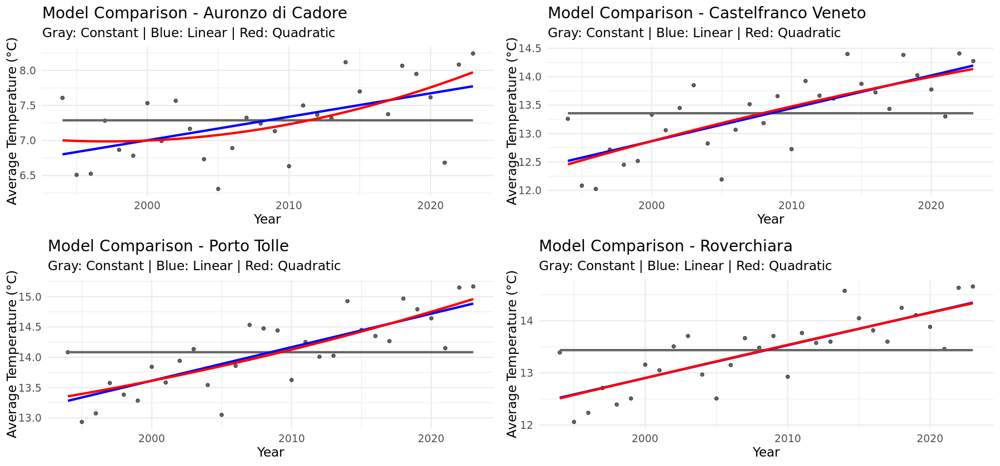

In [46]:

# Helper function to plot all three models for a given station
plot_station_models <- function(df, station_name) {
  ggplot(df, aes(x = Year, y = Avg_mean)) +
    geom_point(color = "black", alpha = 0.6) +
    geom_smooth(method = "lm", formula = y ~ 1, color = "gray40", se = FALSE, size = 1.2) +  # Constant
    geom_smooth(method = "lm", formula = y ~ x, color = "blue", se = FALSE, size = 1.2) +    # Linear
    geom_smooth(method = "lm", formula = y ~ poly(x, 2), color = "red", se = FALSE, size = 1.2) +  # Quadratic
    labs(
      title = paste("Model Comparison -", station_name),
      subtitle = "Gray: Constant | Blue: Linear | Red: Quadratic",
      x = "Year", y = "Average Temperature (°C)"
    ) +
    theme_minimal(base_size = 14)
}

# Generate plots for each station
options(repr.plot.width = 15, repr.plot.height = 7)
plot_A <- plot_station_models(A_avg, "Auronzo di Cadore")
plot_C <- plot_station_models(C_avg, "Castelfranco Veneto")
plot_P <- plot_station_models(P_avg, "Porto Tolle")
plot_R <- plot_station_models(R_avg, "Roverchiara")

# Optionally display them (one at a time or using gridExtra)
library(gridExtra)
grid.arrange(plot_A, plot_C, plot_P, plot_R, ncol = 2)


We can also use Anova, a function which explains the residual variance explained by these kind of nested model, allowing to formally verify if a model is significantly better.

In [27]:
anova(fit_constA, fit_linA, fit_quadA)
anova(fit_constC, fit_linC, fit_quadC)
anova(fit_constP, fit_linP, fit_quadP)
anova(fit_constR, fit_linR, fit_quadR)

# RSS: Residual Variance not explained
# Pr(>F): P-value


,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,29,7.878150,NA,NA,NA,NA
2,28,5.353353,1,2.524798,13.468479,0.001052471
3,27,5.061414,1,0.291939,1.557342,0.222769472


,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,29,13.566630,NA,NA,NA,NA
2,28,6.039449,1,7.52718032,33.8014459,3.459557e-06
3,27,6.012579,1,0.02687016,0.1206628,7.310100e-01


,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,29,11.058750,NA,NA,NA,NA
2,28,4.187914,1,6.87083624,44.7294598,3.528932e-07
3,27,4.147436,1,0.04047762,0.2635111,6.118933e-01


,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,29,13.930500,NA,NA,NA,NA
2,28,5.029167,1,8.90133262,47.79930917,1.982265e-07
3,27,5.028022,1,0.00114532,0.00615026,9.380694e-01


From the result obtained is clear how the linear regression optimally fits the data, while the quadratic regression, despite using more parameters, does not apport significant improvements.

### • perform an analysis using a Bayesian linear regression with JAGS or STAN

For the case Being we choose to use STAN. That's because JAGS is based off Gibbs sampling: a random walk over the space considered. This construction characteristic of the model makes so that it isn't well suited for dealing with high correlation parameters which is what we encounter here in this linear regression.\
We have therefore decided to use STAN, which treats the parameters space more like a physical system using the momentum to create smoother trajectories which converges more efficiently for systems having an high correlation.\
Therefore, since we have to deal with continous data, with high correlation, the latter is the better choice.

In [28]:
# To exploit the Stan functionalities we are going to use the brms package

'''
fit_linearA <- brm(
  formula = Avg_mean ~ Year,    # This is basically the Likelihood, the relationship between the data I have
  data = A_avg,
  family = gaussian(),  # Error distribution for the likelihood, this completes the definition of the likelihood
  prior = c(
    prior(normal(0, 10), class = "Intercept"),    # These are all the Priors for our analysis An alternative could be normal(0,10)
    prior(normal(0, 10), class = "b"),    # The idea is that the intercept and the slope could have any values so to not give any constraints we choose a normal with a very high variance (an uniform prior would be bounded between 0, 1)
    prior(cauchy(0, 5), class = "sigma")    # The third parameter is the variability (standard deviation) of the noise, and tells how much the data is expected to oscillate around the regression line, must be > 0.
  ),
  iter = 5000, warmup = 1000, chains = 4, cores = 4  # Iter: total number of iteration for each mcmc chain, warmup: the first 1000 iterations are discarded, chains: number of chains,
)

fit_linearC <- brm(
  formula = Avg_mean ~ Year,    # This is basically the Likelihood, the relationship between the data I have
  data = C_avg,
  family = gaussian(),  # Error distribution for the likelihood, this completes the definition of the likelihood
  prior = c(
    prior(normal(0, 10), class = "Intercept"),    # These are all the Priors for our analysis An alternative could be normal(0,10)
    prior(normal(0, 10), class = "b"),    # The idea is that the intercept and the slope could have any values so to not give any constraints we choose a normal with a very high variance (an uniform prior would be bounded between 0, 1)
    prior(cauchy(0, 5), class = "sigma")    # The third parameter is the variability (standard deviation) of the noise, and tells how much the data is expected to oscillate around the regression line, must be > 0.
  ),
  iter = 5000, warmup = 1000, chains = 4, cores = 4  # Iter: total number of iteration for each mcmc chain, warmup: the first 1000 iterations are discarded, chains: number of chains,
)

fit_linearP <- brm(
  formula = Avg_mean ~ Year,    # This is basically the Likelihood, the relationship between the data I have
  data = P_avg,
  family = gaussian(),  # Error distribution for the likelihood, this completes the definition of the likelihood
  prior = c(
    prior(normal(0, 10), class = "Intercept"),    # These are all the Priors for our analysis An alternative could be normal(0,10)
    prior(normal(0, 10), class = "b"),    # The idea is that the intercept and the slope could have any values so to not give any constraints we choose a normal with a very high variance (an uniform prior would be bounded between 0, 1)
    prior(cauchy(0, 5), class = "sigma")    # The third parameter is the variability (standard deviation) of the noise, and tells how much the data is expected to oscillate around the regression line, must be > 0.
  ),
  iter = 5000, warmup = 1000, chains = 4, cores = 4  # Iter: total number of iteration for each mcmc chain, warmup: the first 1000 iterations are discarded, chains: number of chains,
)

fit_linearR <- brm(
  formula = Avg_mean ~ Year,    # This is basically the Likelihood, the relationship between the data I have
  data = R_avg,
  family = gaussian(),  # Error distribution for the likelihood, this completes the definition of the likelihood
  prior = c(
    prior(normal(0, 10), class = "Intercept"),    # These are all the Priors for our analysis An alternative could be normal(0,10)
    prior(normal(0, 10), class = "b"),    # The idea is that the intercept and the slope could have any values so to not give any constraints we choose a normal with a very high variance (an uniform prior would be bounded between 0, 1)
    prior(cauchy(0, 5), class = "sigma")    # The third parameter is the variability (standard deviation) of the noise, and tells how much the data is expected to oscillate around the regression line, must be > 0.
  ),
  iter = 5000, warmup = 1000, chains = 4, cores = 4  # Iter: total number of iteration for each mcmc chain, warmup: the first 1000 iterations are discarded, chains: number of chains,
)

saveRDS(fit_linearA, file = "fit_linearA.rds")
saveRDS(fit_linearC, file = "fit_linearC.rds")
saveRDS(fit_linearP, file = "fit_linearP.rds")
saveRDS(fit_linearR, file = "fit_linearR.rds")
'''


ERROR: Error in parse(text = input): <text>:3:3: unexpected string constant
55: saveRDS(fit_linearR, file = "fit_linearR.rds")
56: '
      ^


 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Avg_mean ~ Year 
   Data: A_avg (Number of observations: 30) 
  Draws: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup draws = 16000

Regression Coefficients:
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept   -59.92     19.44   -97.99   -20.97 1.00    14195    11050
Year          0.03      0.01     0.01     0.05 1.00    14192    10990

Further Distributional Parameters:
      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma     0.46      0.06     0.35     0.61 1.00    11907    10310

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Avg_mean ~ Year 
   Data: C_avg (Number of observations: 30) 
  Draws: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup draws = 16000

Regression Coefficients:
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept  -102.69     20.53  -142.35   -61.41 1.00    13363    10831
Year          0.06      0.01     0.04     0.08 1.00    13361    10793

Further Distributional Parameters:
      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma     0.49      0.07     0.37     0.64 1.00    12354     9786

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

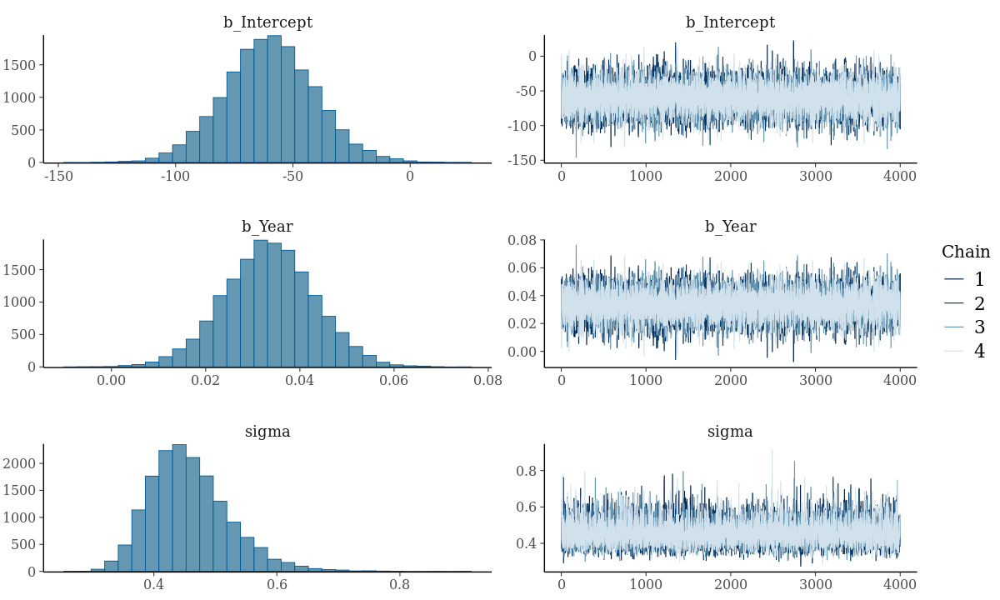

 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Avg_mean ~ Year 
   Data: P_avg (Number of observations: 30) 
  Draws: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup draws = 16000

Regression Coefficients:
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept   -96.96     17.30  -131.46   -62.75 1.00    13165    10539
Year          0.06      0.01     0.04     0.07 1.00    13166    10552

Further Distributional Parameters:
      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma     0.41      0.06     0.31     0.54 1.00    11292     9703

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

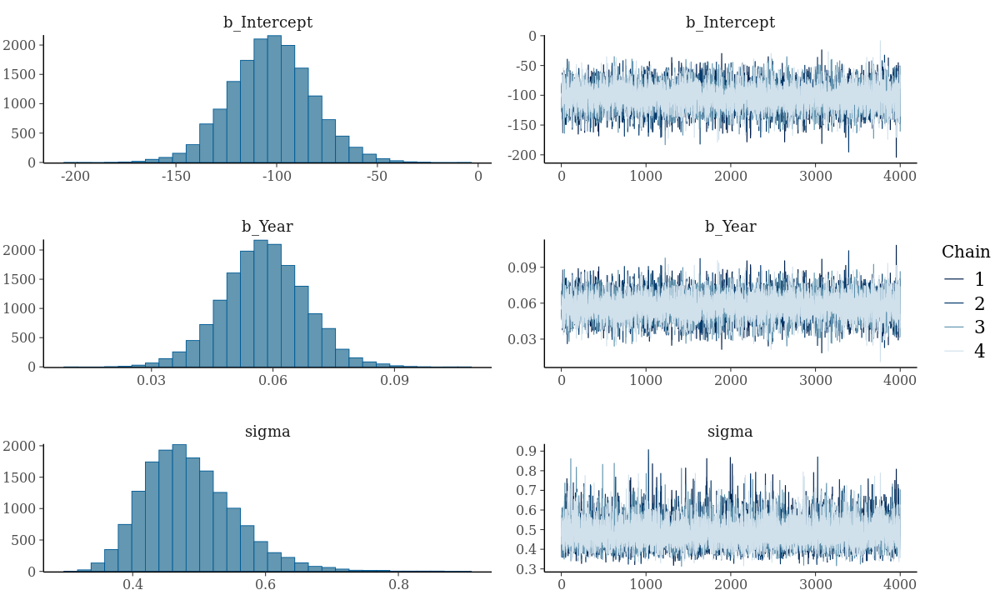

 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Avg_mean ~ Year 
   Data: R_avg (Number of observations: 30) 
  Draws: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup draws = 16000

Regression Coefficients:
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept  -112.92     18.87  -150.04   -75.76 1.00    14453    11218
Year          0.06      0.01     0.04     0.08 1.00    14447    11259

Further Distributional Parameters:
      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma     0.44      0.06     0.34     0.59 1.00    12248    10369

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

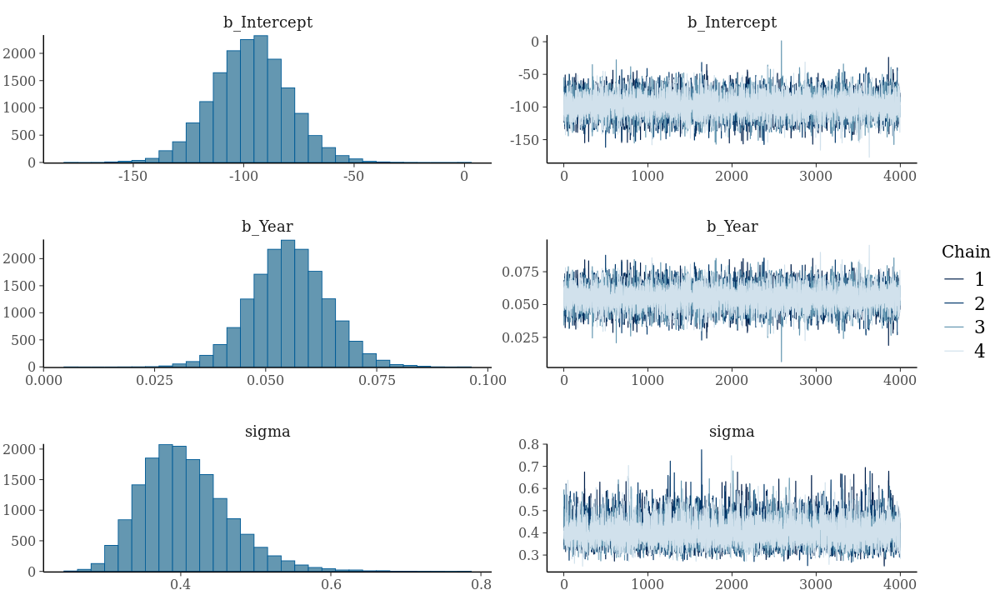

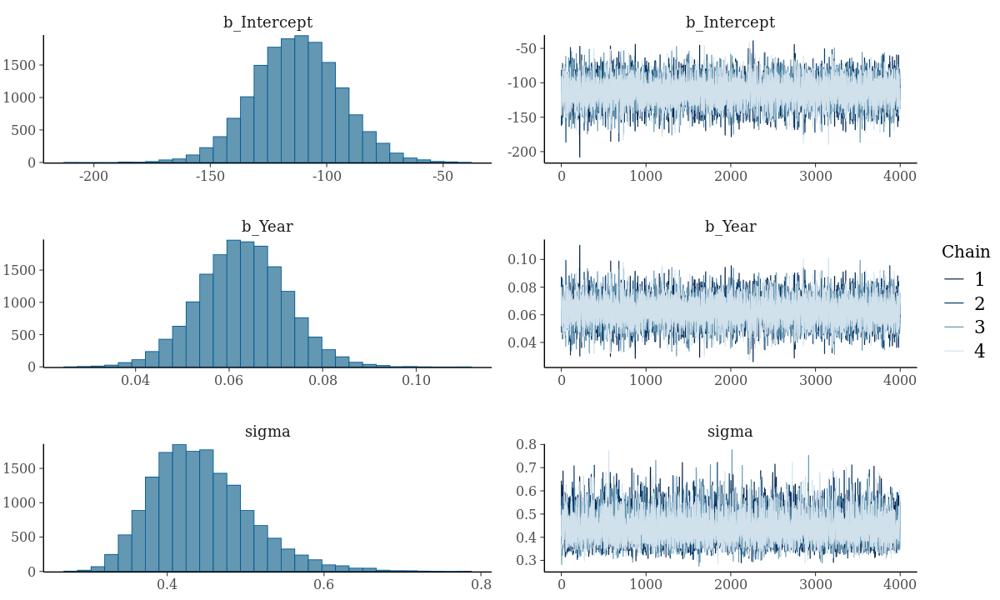

In [41]:
# Load the previously saved model

fit_linearA <- readRDS("fit_linearA.rds")
fit_linearC <- readRDS("fit_linearC.rds")
fit_linearP <- readRDS("fit_linearP.rds")
fit_linearR <- readRDS("fit_linearR.rds")

summary(fit_linearA)
plot(fit_linearA)
summary(fit_linearC)
plot(fit_linearC)
summary(fit_linearP)
plot(fit_linearP)
summary(fit_linearR)
plot(fit_linearR)


Using 10 posterior draws for ppc type 'dens_overlay' by default.



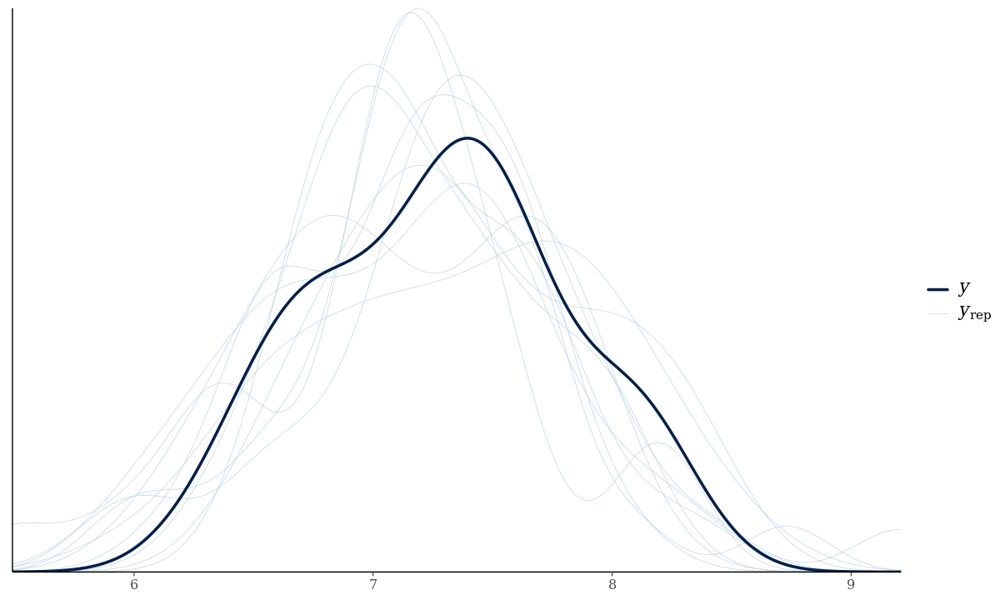

Using 10 posterior draws for ppc type 'dens_overlay' by default.



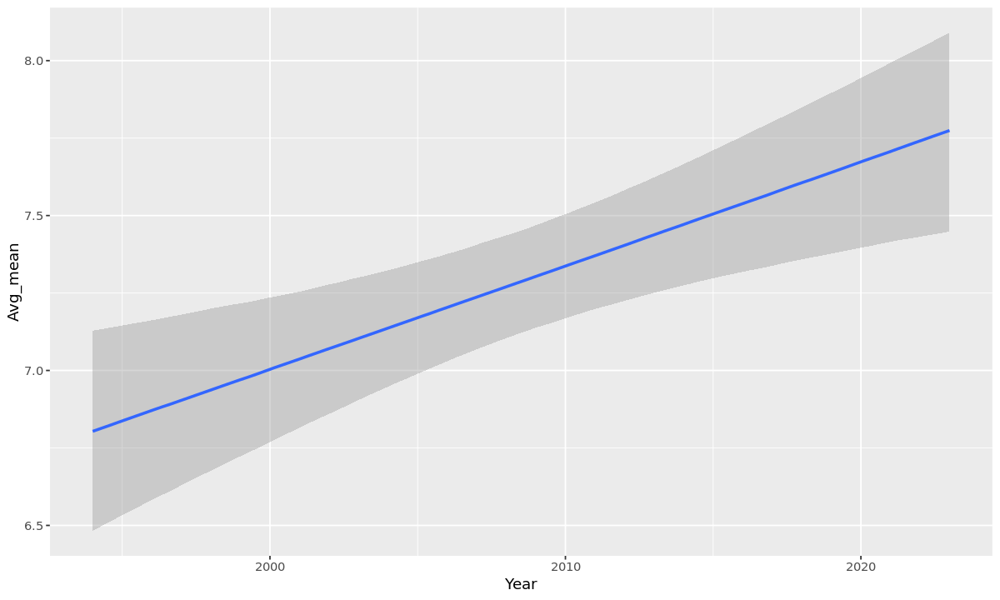

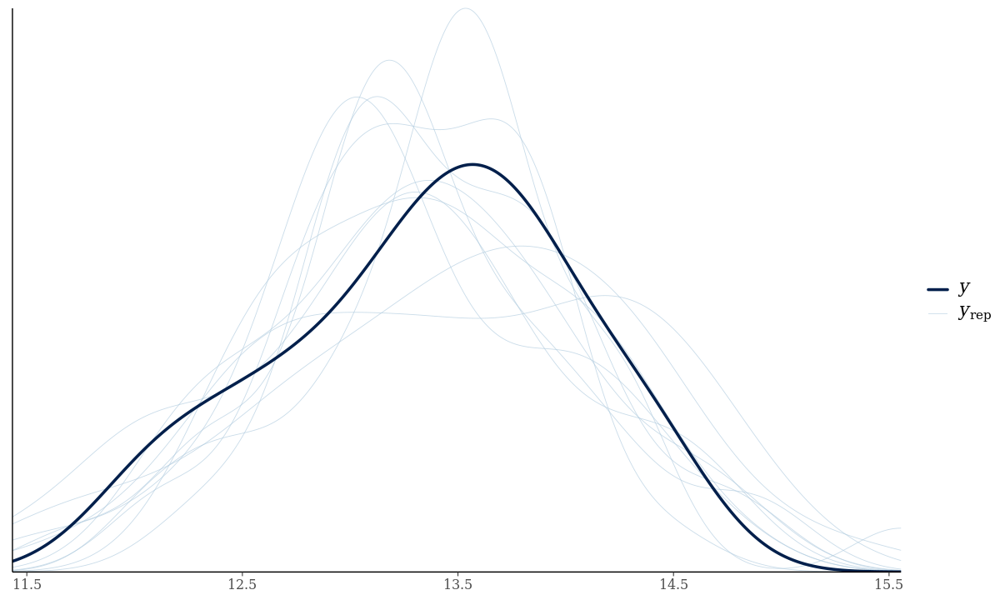

Using 10 posterior draws for ppc type 'dens_overlay' by default.



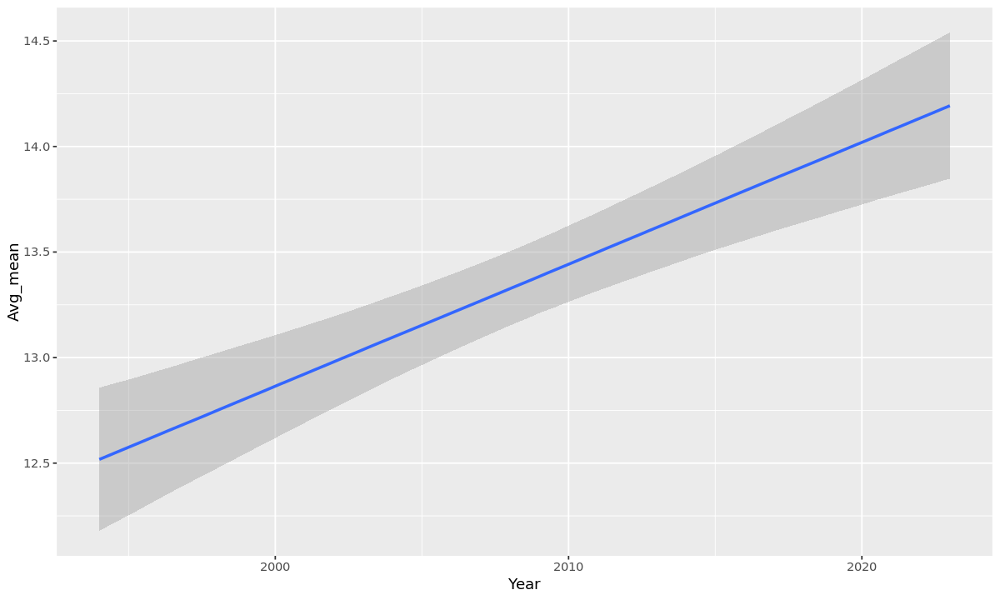

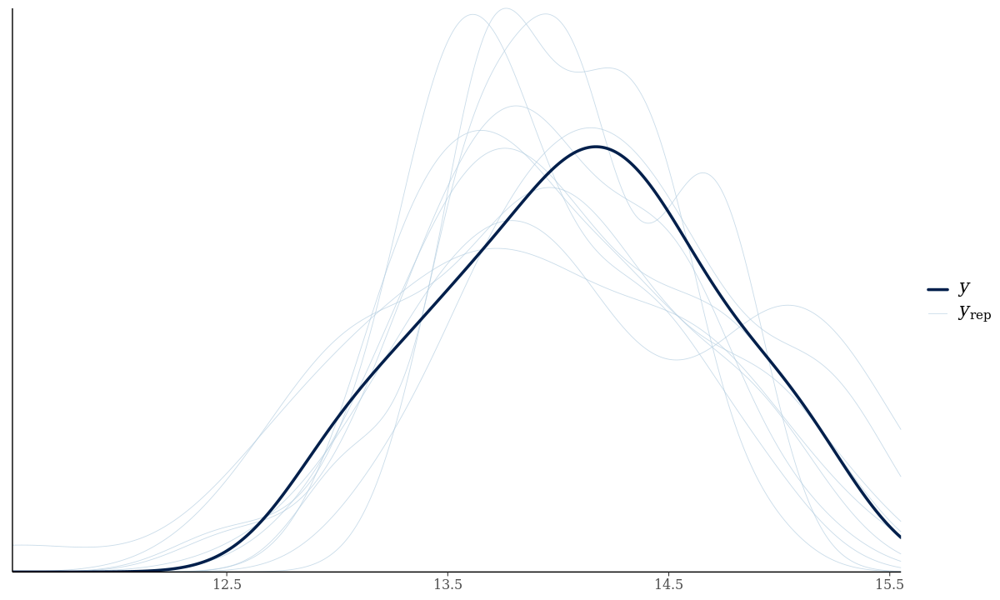

Using 10 posterior draws for ppc type 'dens_overlay' by default.



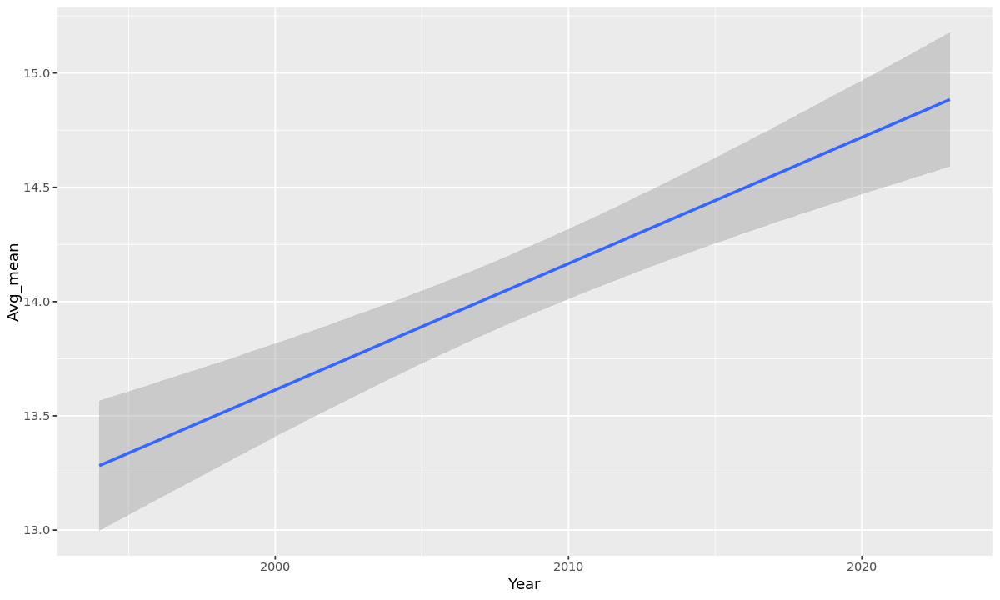

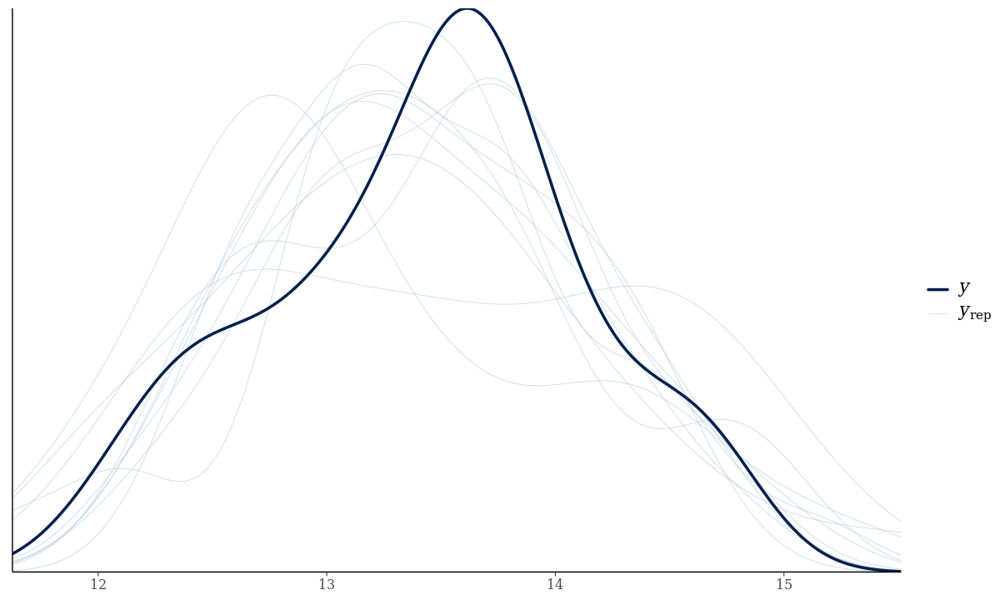

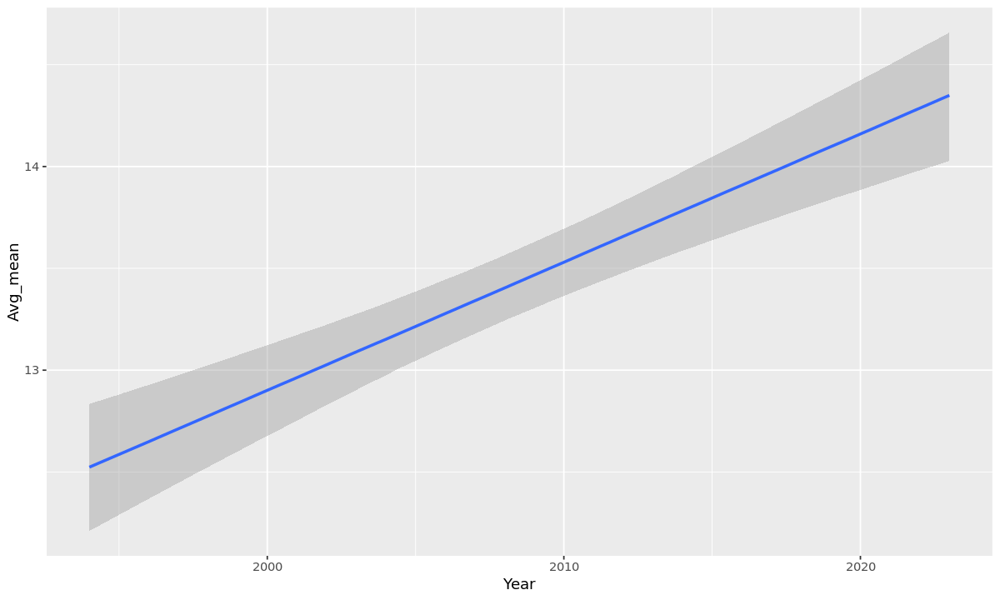

In [30]:
pp_check(fit_linearA)  # posterior check plot; Overlays the posterior obtained with the data given, with the distributions of simulated values. The simulated data matches enoughly well the data given.
conditional_effects(fit_linearA)  # visualize a plot of the regression with a confidence interval overlay

pp_check(fit_linearC)
conditional_effects(fit_linearC)

pp_check(fit_linearP)
conditional_effects(fit_linearP)

pp_check(fit_linearR)
conditional_effects(fit_linearR)


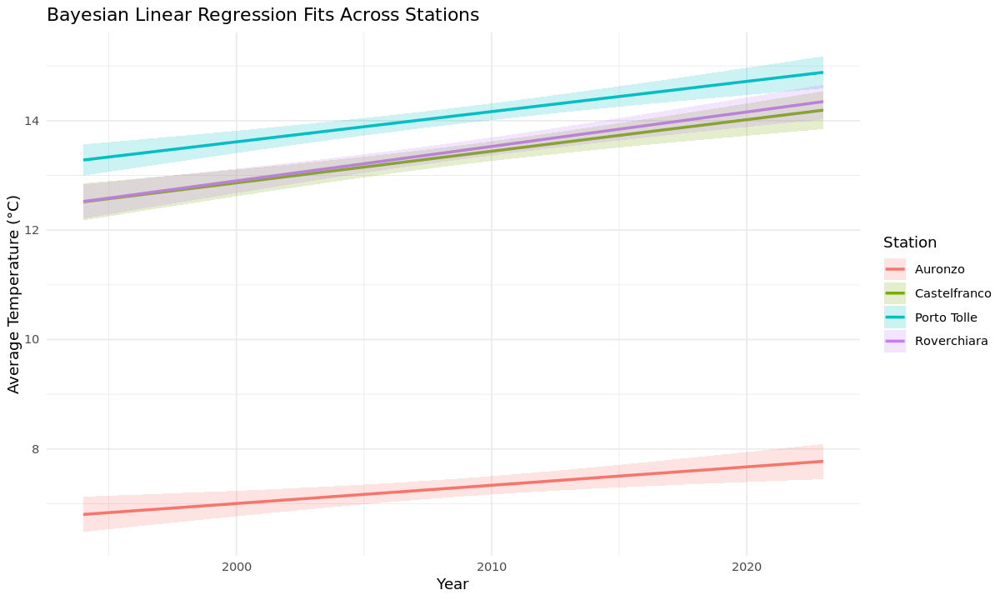

In [31]:
library(brms)
library(ggplot2)
library(gridExtra)

# Extract fitted values (posterior mean + credible interval)
fit_df_A <- as.data.frame(conditional_effects(fit_linearA)[[1]]) %>%
  mutate(Station = "Auronzo")
fit_df_C <- as.data.frame(conditional_effects(fit_linearC)[[1]]) %>%
  mutate(Station = "Castelfranco")
fit_df_P <- as.data.frame(conditional_effects(fit_linearP)[[1]]) %>%
  mutate(Station = "Porto Tolle")
fit_df_R <- as.data.frame(conditional_effects(fit_linearR)[[1]]) %>%
  mutate(Station = "Roverchiara")

# Combine all into one dataframe
all_fits <- bind_rows(fit_df_A, fit_df_C, fit_df_P, fit_df_R)

# Plot
ggplot(all_fits, aes(x = Year, y = estimate__, color = Station, fill = Station)) +
  geom_line(size = 1) +
  geom_ribbon(aes(ymin = lower__, ymax = upper__), alpha = 0.2, color = NA) +
  labs(
    title = "Bayesian Linear Regression Fits Across Stations",
    y = "Average Temperature (°C)"
  ) +
  theme_minimal()


In [32]:
plot_station_models_with_bayes <- function(df, station_name, fit_const, fit_lin, fit_quad, bayes_fit) {
  df$fit_const <- predict(fit_const)
  df$fit_lin   <- predict(fit_lin)
  df$fit_quad  <- predict(fit_quad)

  ggplot(df, aes(x = Year, y = Avg_mean)) +
    geom_point(color = "black", size = 2) +
    geom_line(aes(y = fit_lin), color = "red", size = 2.2) +
    
    # Add Bayesian fit
    geom_line(data = bayes_fit, aes(x = Year, y = estimate__), color = "darkgreen", size = 1.2) +
    geom_ribbon(data = bayes_fit, aes(x = Year, ymin = lower__, ymax = upper__), 
                alpha = 0.2, fill = "darkgreen") +

    labs(
      title = paste("Model Comparison -", station_name),
      subtitle = "Gray: Constant | Blue: Linear | Red: Quadratic | Green: Bayesian Linear Fit",
      x = "Year",
      y = "Average Temperature (°C)"
    ) +
    theme_minimal(base_size = 14)
}


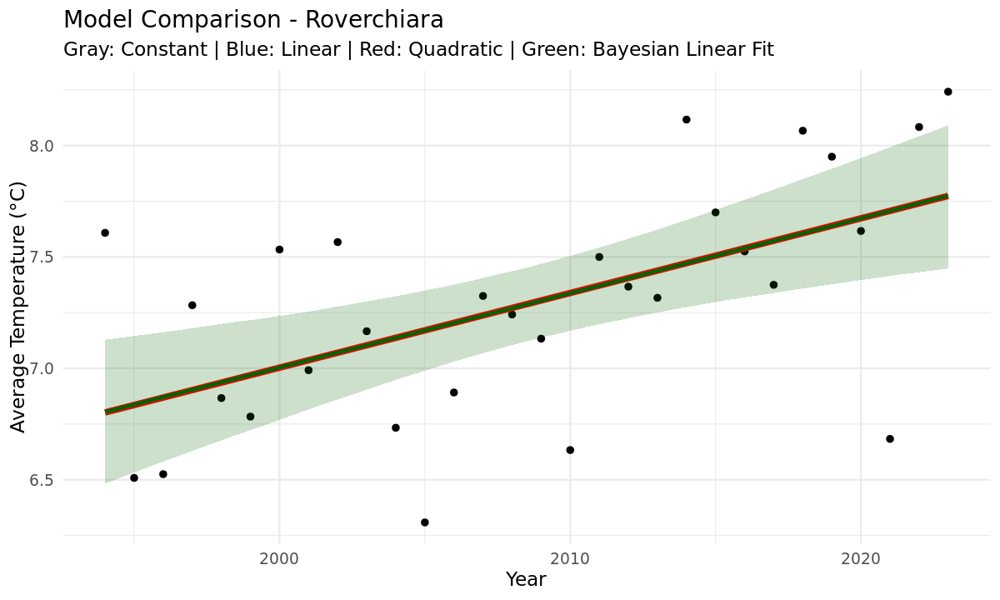

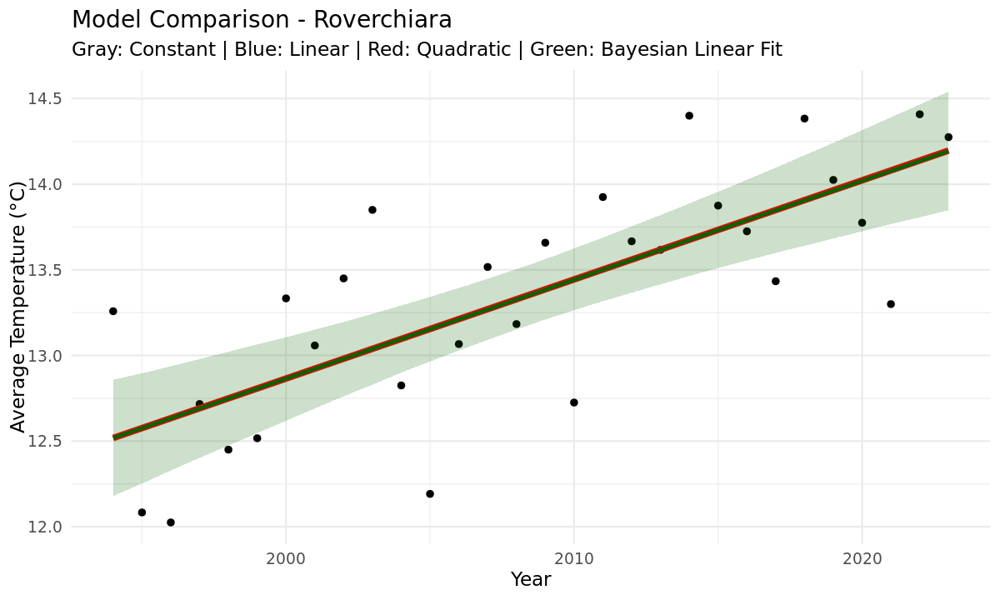

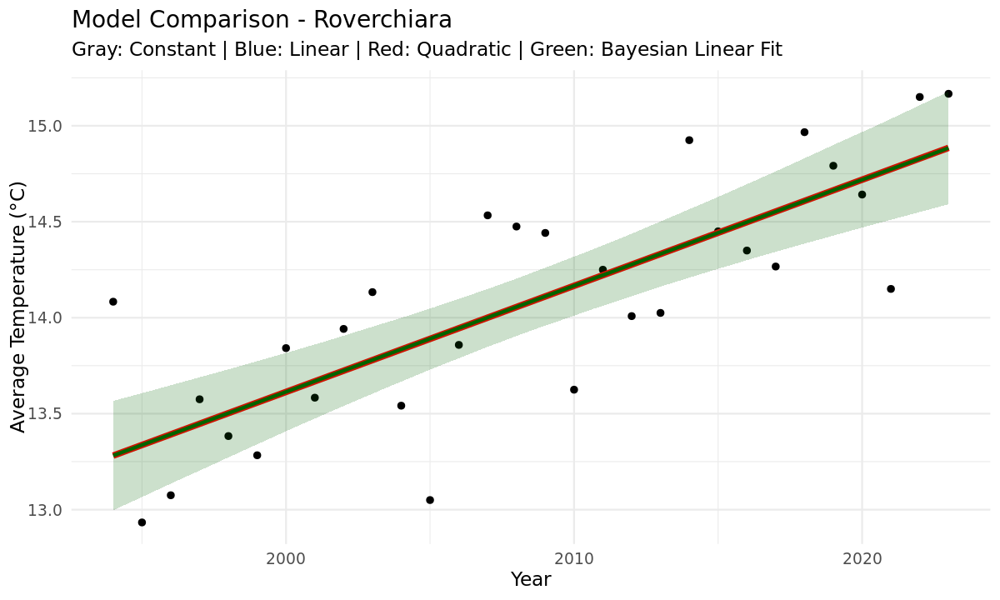

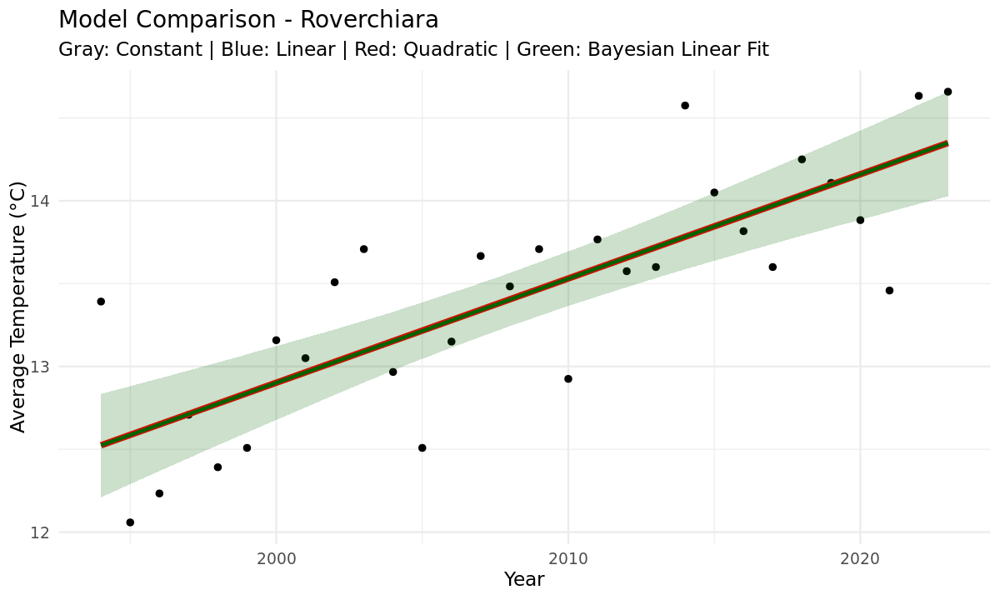

In [33]:
# Assuming you've already defined fit_constR, fit_linR, fit_quadR, and fit_linearR
bayes_fit_A <- conditional_effects(fit_linearA)[["Year"]]

plot_station_models_with_bayes(A_avg, "Roverchiara", fit_constA, fit_linA, fit_quadA, bayes_fit_A)

bayes_fit_C <- conditional_effects(fit_linearC)[["Year"]]

plot_station_models_with_bayes(C_avg, "Roverchiara", fit_constC, fit_linC, fit_quadC, bayes_fit_C)

bayes_fit_P <- conditional_effects(fit_linearP)[["Year"]]

plot_station_models_with_bayes(P_avg, "Roverchiara", fit_constP, fit_linP, fit_quadP, bayes_fit_P)

bayes_fit_R <- conditional_effects(fit_linearR)[["Year"]]

plot_station_models_with_bayes(R_avg, "Roverchiara", fit_constR, fit_linR, fit_quadR, bayes_fit_R)


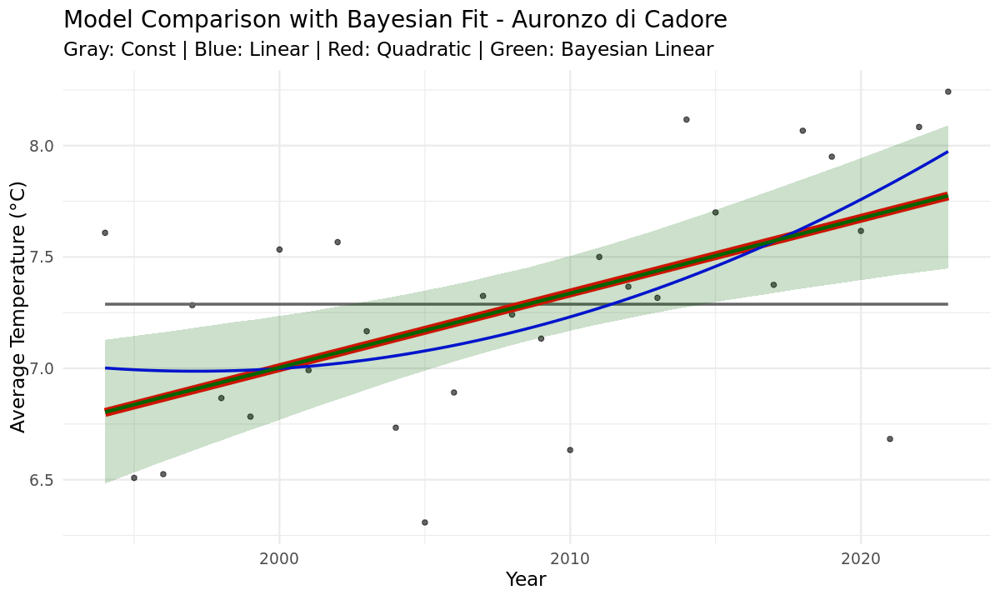

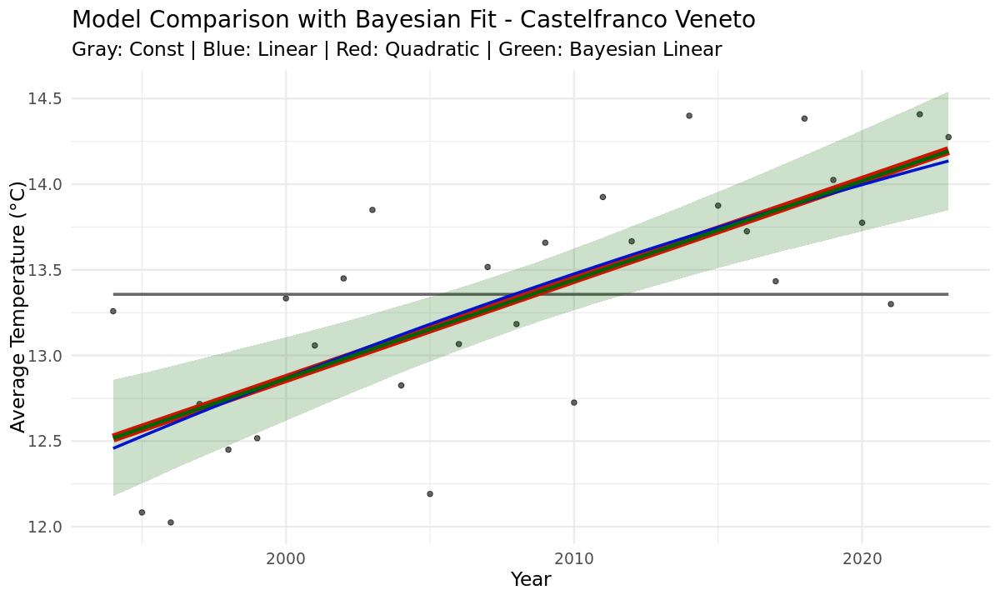

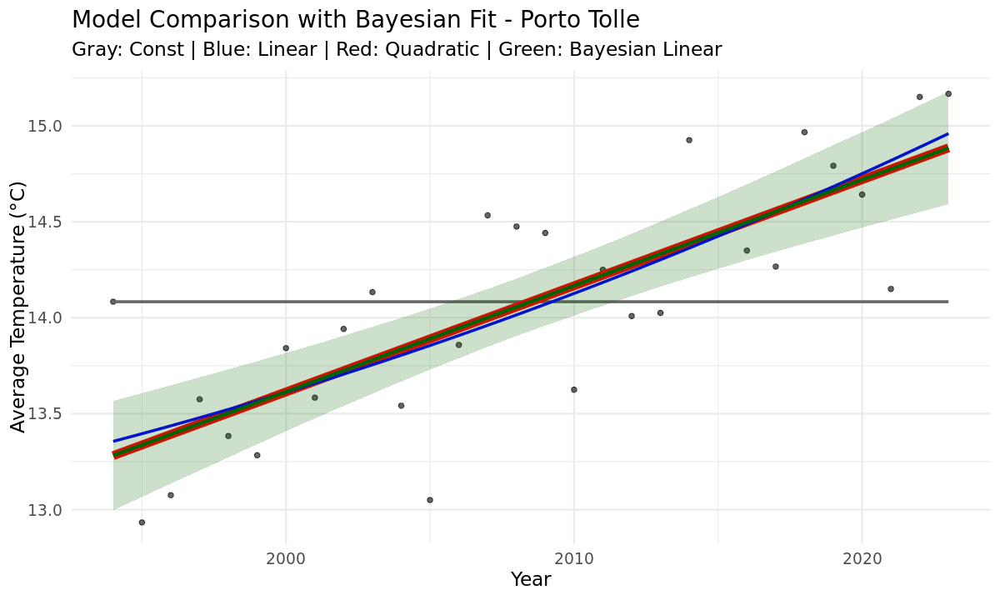

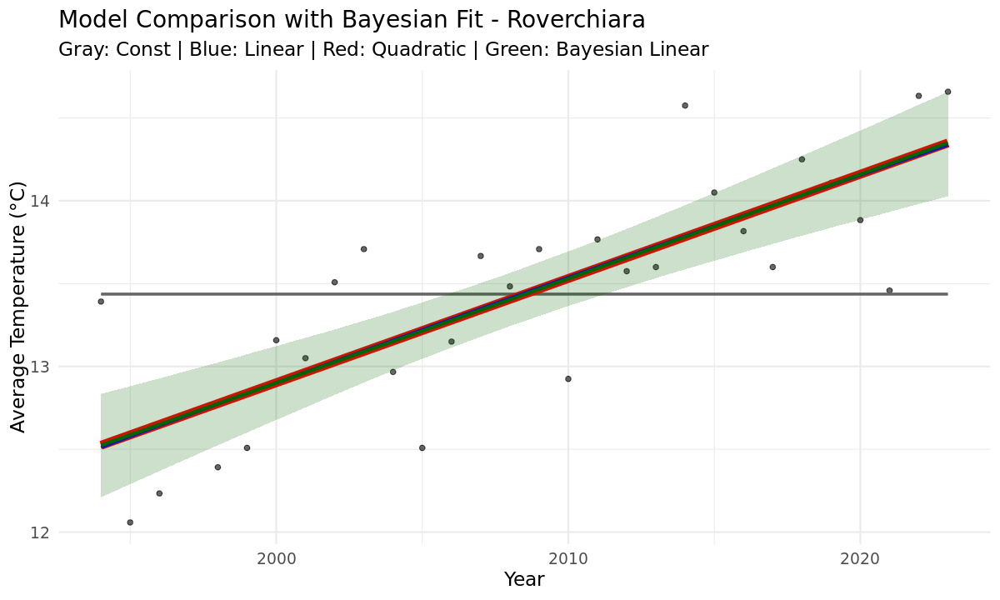

In [34]:
# Helper function to create Bayesian conditional effects overlay
get_ce_df <- function(fit) {
  ce <- conditional_effects(fit)
  ce_df <- as.data.frame(ce$Year)
  return(ce_df)
}

# Extract conditional effects for each station
ce_A <- get_ce_df(fit_linearA)
ce_C <- get_ce_df(fit_linearC)
ce_P <- get_ce_df(fit_linearP)
ce_R <- get_ce_df(fit_linearR)

# Updated plotting function to include Bayesian fit
plot_with_bayes <- function(df, ce_df, station_name) {
  ggplot(df, aes(x = Year, y = Avg_mean)) +
    geom_point(color = "black", alpha = 0.6) +
    geom_smooth(method = "lm", formula = y ~ 1, color = "gray40", se = FALSE, size = 1) +  # Constant
    geom_smooth(method = "lm", formula = y ~ x, color = "red", se = FALSE, size = 3) +    # Linear
    geom_smooth(method = "lm", formula = y ~ poly(x, 2), color = "blue", se = FALSE, size = 1) +  # Quadratic
    # Overlay Bayesian linear regression
    geom_line(data = ce_df, aes(x = Year, y = estimate__), color = "darkgreen", size = 1.2) +
    geom_ribbon(data = ce_df, aes(x = Year, ymin = lower__, ymax = upper__), fill = "darkgreen", alpha = 0.2) +
    labs(
      title = paste("Model Comparison with Bayesian Fit -", station_name),
      subtitle = "Gray: Const | Blue: Linear | Red: Quadratic | Green: Bayesian Linear",
      x = "Year", y = "Average Temperature (°C)"
    ) +
    theme_minimal(base_size = 14)
}

# Generate all plots
plot_A <- plot_with_bayes(A_avg, ce_A, "Auronzo di Cadore")
plot_C <- plot_with_bayes(C_avg, ce_C, "Castelfranco Veneto")
plot_P <- plot_with_bayes(P_avg, ce_P, "Porto Tolle")
plot_R <- plot_with_bayes(R_avg, ce_R, "Roverchiara")

plot_A
plot_C
plot_P
plot_R



In [35]:
plot_priors_posteriors <- function(fit, station_name = "Station") {
  set.seed(123)
  
  # Simulate prior distributions
  prior_intercept <- rnorm(10000, mean = 0, sd = 1000)
  prior_beta <- rnorm(10000, mean = 0, sd = 1000)
  prior_sigma <- rcauchy(10000, location = 0, scale = 5)
  prior_sigma <- prior_sigma[prior_sigma > 0]  # sigma must be > 0
  
  # Extract posterior samples
  post <- posterior::as_draws_df(fit)
  
  # Plot 1: Prior - Intercept
  p1 <- ggplot(data.frame(Intercept = prior_intercept), aes(x = Intercept)) +
    geom_density(fill = "skyblue", alpha = 0.5) +
    ggtitle(paste(station_name, "- Prior: Intercept")) + xlab("Intercept") + ylab("Density")
  
  # Plot 2: Posterior - Intercept
  p2 <- ggplot(post, aes(x = b_Intercept)) +
    geom_density(fill = "sandybrown", alpha = 0.6) +
    ggtitle(paste(station_name, "- Posterior: Intercept")) + xlab("Intercept") + ylab("Density")
  
  # Plot 3: Prior - Slope (beta)
  p3 <- ggplot(data.frame(beta = prior_beta), aes(x = beta)) +
    geom_density(fill = "lightgreen", alpha = 0.5) +
    ggtitle(paste(station_name, "- Prior: Slope (beta)")) + xlab("beta") + ylab("Density")
  
  # Plot 4: Posterior - Slope (beta)
  p4 <- ggplot(post, aes(x = b_Year)) +
    geom_density(fill = "indianred2", alpha = 0.6) +
    ggtitle(paste(station_name, "- Posterior: Slope (beta)")) + xlab("beta") + ylab("Density")
  
  # Plot 5: Prior - Sigma
  p5 <- ggplot(data.frame(sigma = prior_sigma), aes(x = sigma)) +
    geom_density(fill = "lavender", alpha = 0.5) +
    xlim(0, 30) +
    ggtitle(paste(station_name, "- Prior: Sigma")) + xlab("sigma") + ylab("Density")
  
  # Plot 6: Posterior - Sigma
  p6 <- ggplot(post, aes(x = sigma)) +
    geom_density(fill = "pink", alpha = 0.6) +
    ggtitle(paste(station_name, "- Posterior: Sigma")) + xlab("sigma") + ylab("Density")
  
  # Arrange all 6 plots
  grid.arrange(p1, p2, p3, p4, p5, p6, ncol = 2)
}


Warning message:
“Removed 534 rows containing non-finite outside the scale range
(`stat_density()`).”
Warning message:
“Removed 534 rows containing non-finite outside the scale range
(`stat_density()`).”


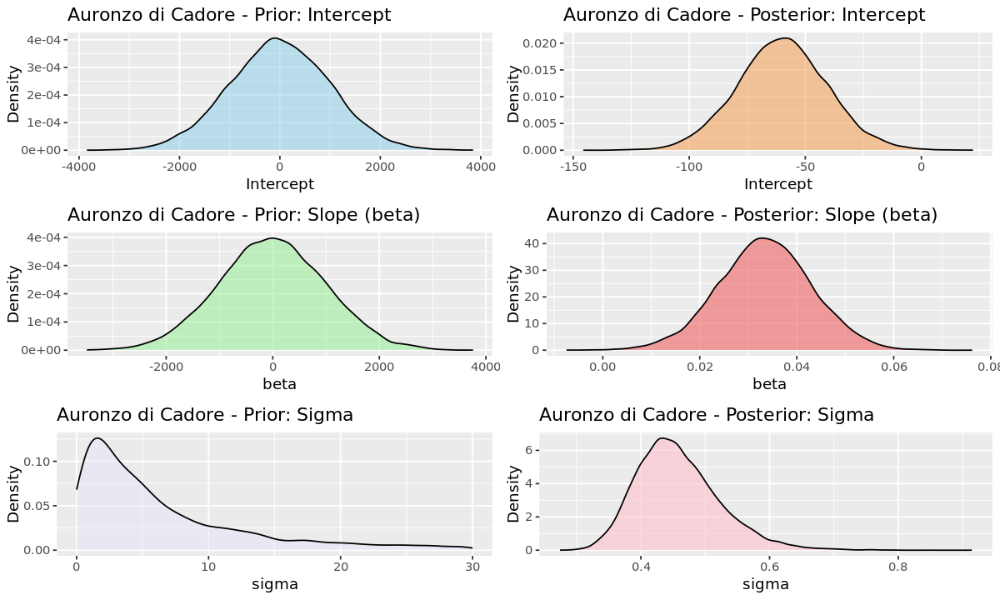

Warning message:
“Removed 534 rows containing non-finite outside the scale range
(`stat_density()`).”


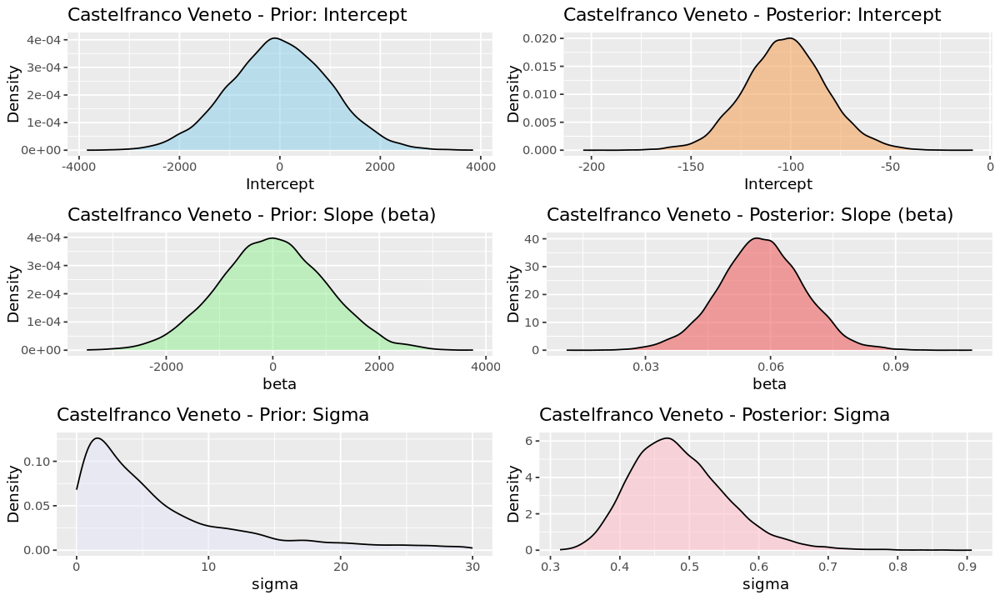

Warning message:
“Removed 534 rows containing non-finite outside the scale range
(`stat_density()`).”


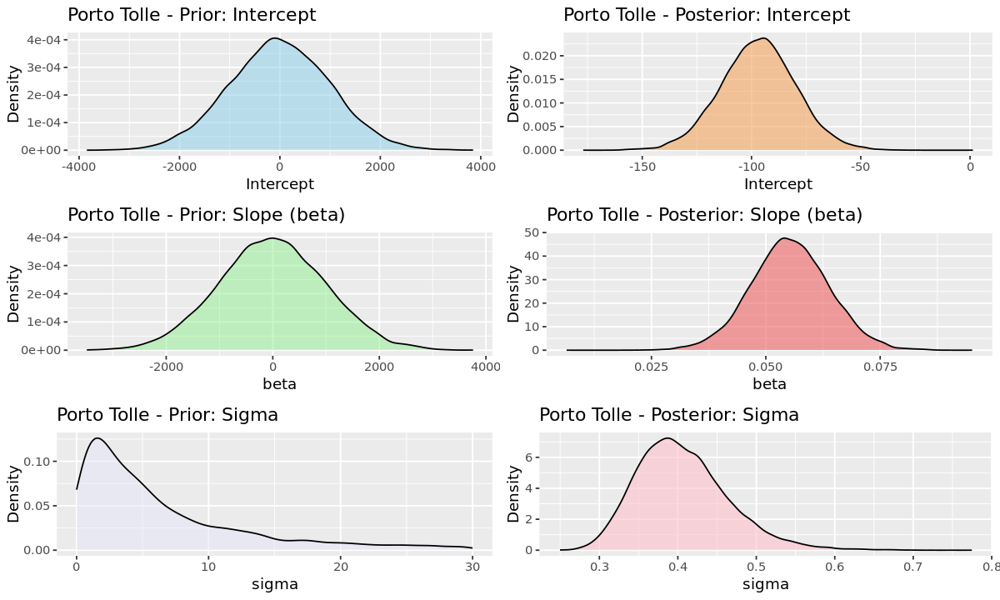

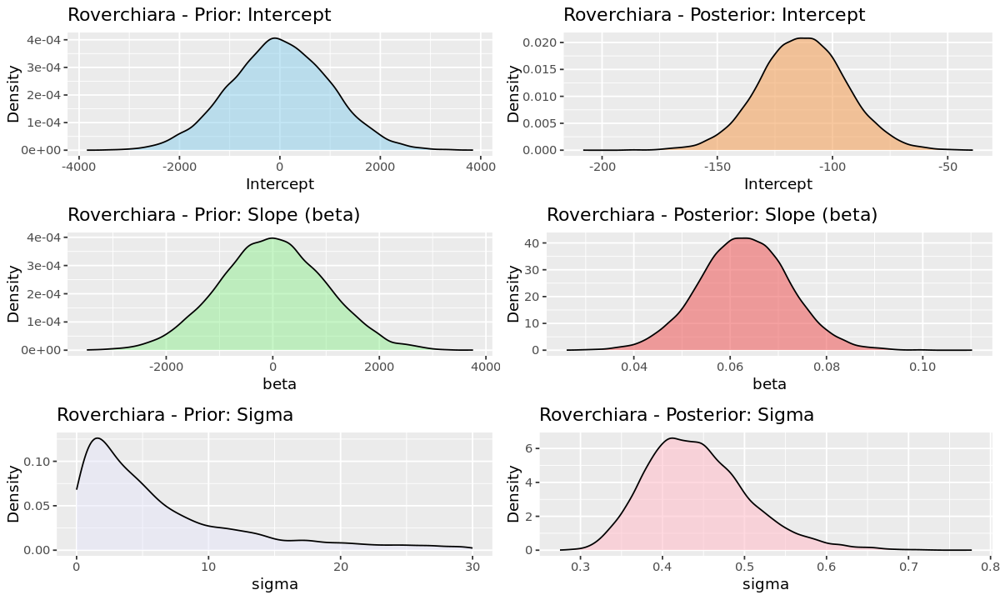

In [36]:
plot_priors_posteriors(fit_linearA, station_name = "Auronzo di Cadore")
plot_priors_posteriors(fit_linearC, station_name = "Castelfranco Veneto")
plot_priors_posteriors(fit_linearP, station_name = "Porto Tolle")
plot_priors_posteriors(fit_linearR, station_name = "Roverchiara")


### • perform the same analysis using a constant regression

The new model will estimate the average value of the averages of temperatures assuming no dependence on the years.

The model assumes that the mean is normally distributed around a constant mean (intercept) with some residual noise (sigma).


In [37]:
'''fit_constantA <- brm(
  formula = Avg_mean ~ 1,    # Likelihood for a linear fit, Constant model: only the intercept is estimated
  data = A_avg,
  family = gaussian(),  # Error likelihood
  prior = c(
    prior(normal(0, 10), class = "Intercept"),    # Constant value prior
    prior(cauchy(0, 5), class = "sigma")    # Noise prior
  ),
  iter = 5000, warmup = 1000, chains = 4, cores = 4 
)

fit_constantC <- brm(
  formula = Avg_mean ~ 1,    # Likelihood for a linear fit, Constant model: only the intercept is estimated
  data = C_avg,
  family = gaussian(),  # Error likelihood
  prior = c(
    prior(normal(0, 10), class = "Intercept"),    # Constant value prior
    prior(cauchy(0, 5), class = "sigma")    # Noise prior
  ),
  iter = 5000, warmup = 1000, chains = 4, cores = 4 
)


fit_constantP <- brm(
  formula = Avg_mean ~ 1,    # Likelihood for a linear fit, Constant model: only the intercept is estimated
  data = P_avg,
  family = gaussian(),  # Error likelihood
  prior = c(
    prior(normal(0, 10), class = "Intercept"),    # Constant value prior
    prior(cauchy(0, 5), class = "sigma")    # Noise prior
  ),
  iter = 5000, warmup = 1000, chains = 4, cores = 4 
)


fit_constantR <- brm(
  formula = Avg_mean ~ 1,    # Likelihood for a linear fit, Constant model: only the intercept is estimated
  data = R_avg,
  family = gaussian(),  # Error likelihood
  prior = c(
    prior(normal(0, 10), class = "Intercept"),    # Constant value prior
    prior(cauchy(0, 5), class = "sigma")    # Noise prior
  ),
  iter = 5000, warmup = 1000, chains = 4, cores = 4 
)

saveRDS(fit_constantA, file = "fit_constantA.rds")
saveRDS(fit_constantC, file = "fit_constantC.rds")
saveRDS(fit_constantP, file = "fit_constantP.rds")
saveRDS(fit_constantR, file = "fit_constantR.rds")
'''


ERROR: Error in parse(text = input): <text>:1:3: unexpected string constant
50: saveRDS(fit_constantR, file = "fit_constantR.rds")
51: '
      ^


 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Avg_mean ~ 1 
   Data: A_avg (Number of observations: 30) 
  Draws: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup draws = 16000

Regression Coefficients:
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     7.29      0.10     7.08     7.49 1.00    10708     8581

Further Distributional Parameters:
      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma     0.54      0.08     0.42     0.72 1.00    11095     8923

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Avg_mean ~ 1 
   Data: C_avg (Number of observations: 30) 
  Draws: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup draws = 16000

Regression Coefficients:
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept    13.35      0.13    13.09    13.61 1.00    11580     9745

Further Distributional Parameters:
      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma     0.72      0.10     0.55     0.95 1.00    11106     9678

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

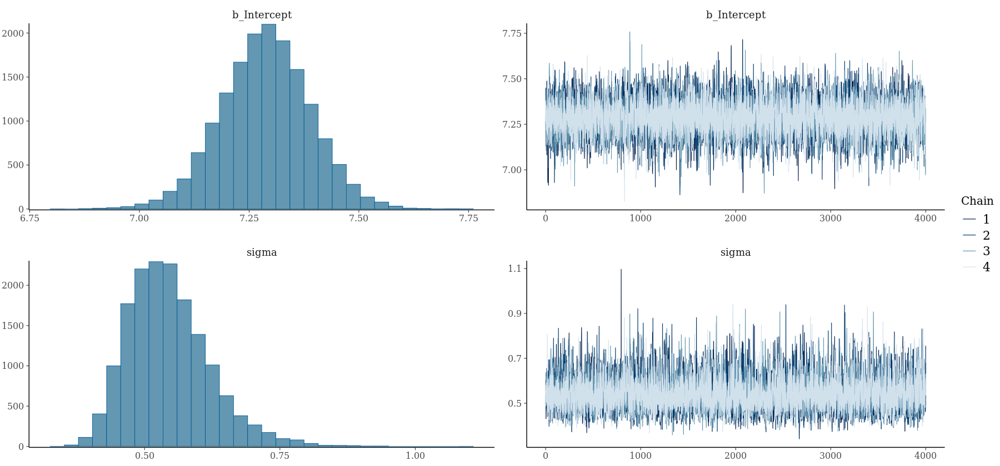

 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Avg_mean ~ 1 
   Data: P_avg (Number of observations: 30) 
  Draws: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup draws = 16000

Regression Coefficients:
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept    14.08      0.12    13.85    14.32 1.00    12019     9926

Further Distributional Parameters:
      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma     0.65      0.09     0.50     0.85 1.00    11864    10527

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

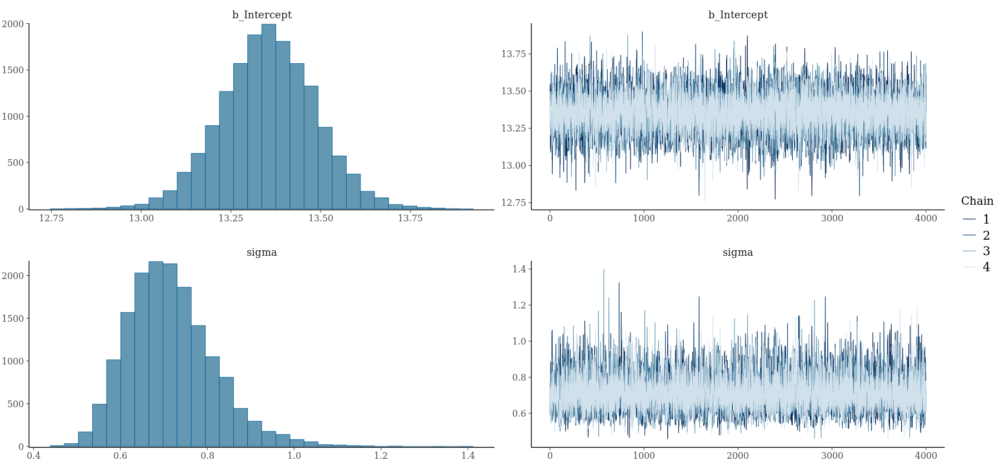

 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Avg_mean ~ 1 
   Data: R_avg (Number of observations: 30) 
  Draws: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup draws = 16000

Regression Coefficients:
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept    13.44      0.13    13.17    13.71 1.00     9682     8878

Further Distributional Parameters:
      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma     0.72      0.10     0.56     0.96 1.00    10644     9137

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

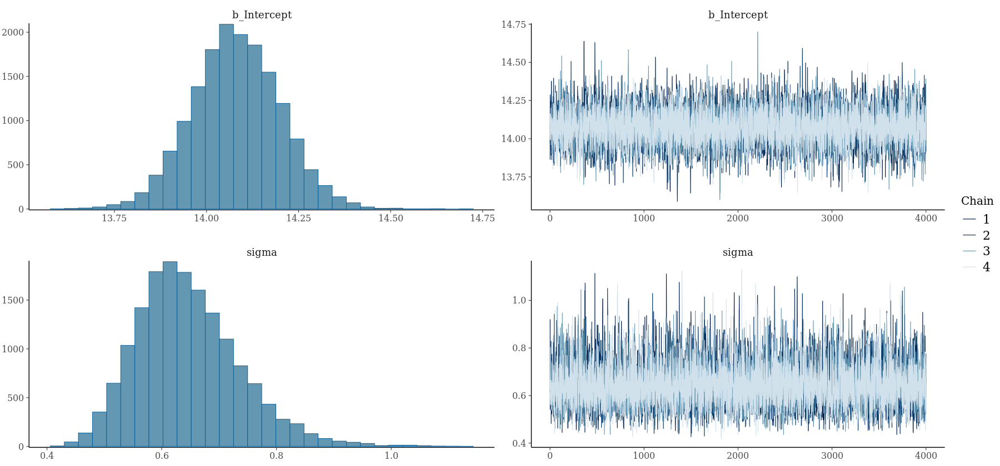

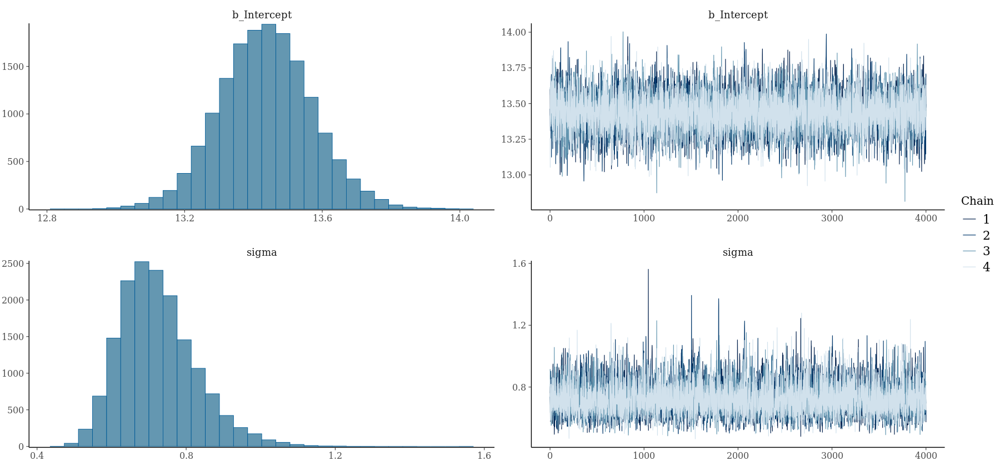

In [57]:
fit_constantA <- readRDS("fit_constantA.rds")
fit_constantC <- readRDS("fit_constantC.rds")
fit_constantP <- readRDS("fit_constantP.rds")
fit_constantR <- readRDS("fit_constantR.rds")

summary(fit_constantA)
plot(fit_constantA)
summary(fit_constantC)
plot(fit_constantC)
summary(fit_constantP)
plot(fit_constantP)
summary(fit_constantR)
plot(fit_constantR)


Using 10 posterior draws for ppc type 'dens_overlay' by default.

Using 10 posterior draws for ppc type 'dens_overlay' by default.



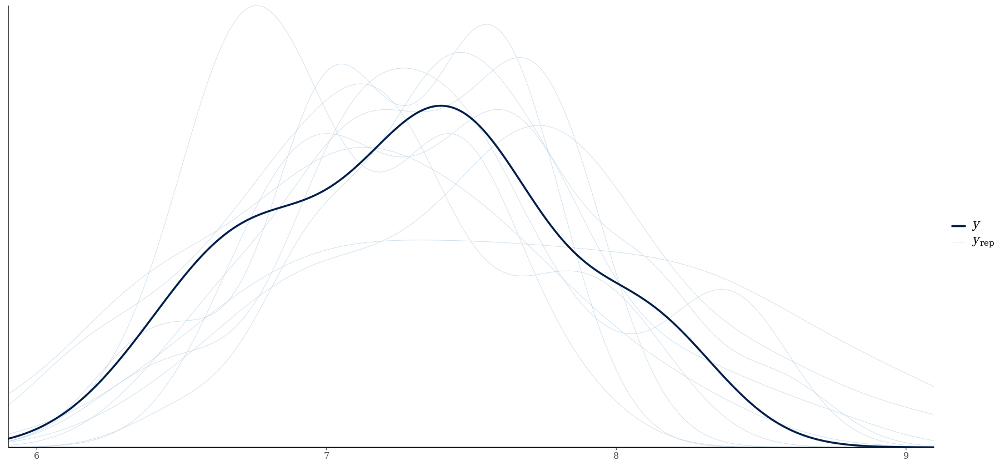

Using 10 posterior draws for ppc type 'dens_overlay' by default.



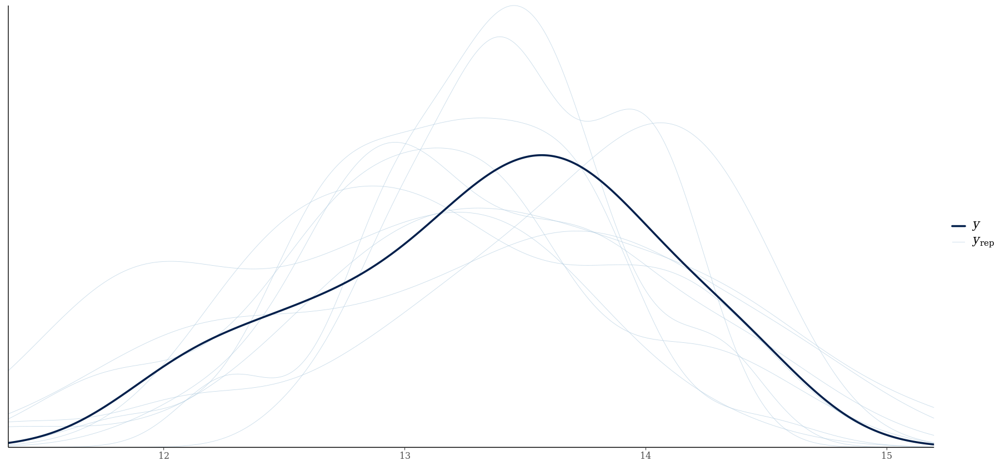

Using 10 posterior draws for ppc type 'dens_overlay' by default.



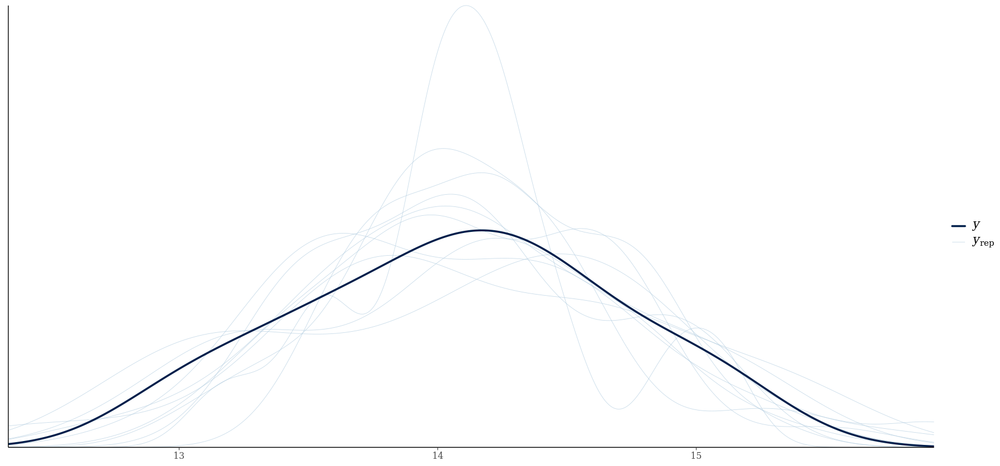

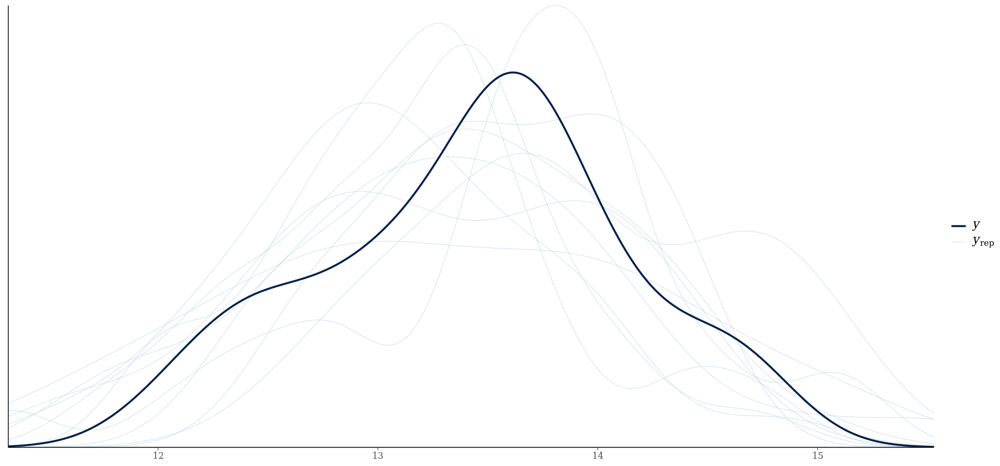

In [50]:
pp_check(fit_constantA)  # Posterior predictive check – how well does a flat model fit the data?
pp_check(fit_constantC)
pp_check(fit_constantP)
pp_check(fit_constantR)
# conditional_effects(fit_constant)  # Shows posterior mean of the constant with credible interval
# fit linear has no predictors — it's a constant regression (intercept-only model). Since conditional_effects() is used to show how predictors affect the outcome, it doesn't know what to visualize because:


Warning message:
“Argument 'pars' is deprecated. Please use 'variable' instead.”


Warning message:
“Argument 'pars' is deprecated. Please use 'variable' instead.”
Warning message:
“Argument 'pars' is deprecated. Please use 'variable' instead.”
Warning message:
“Argument 'pars' is deprecated. Please use 'variable' instead.”


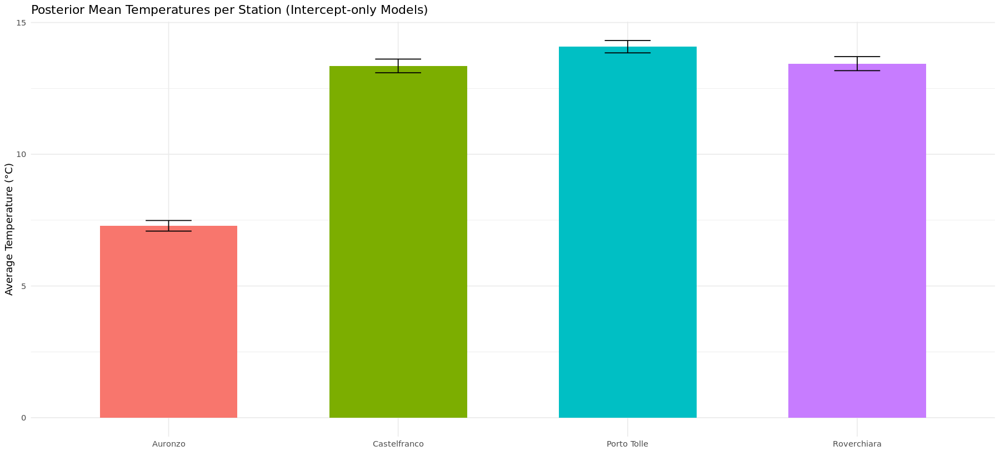

In [55]:
# Extract posterior summaries for the intercepts
library(dplyr)

summary_A <- posterior_summary(fit_constantA, pars = "b_Intercept")
summary_C <- posterior_summary(fit_constantC, pars = "b_Intercept")
summary_P <- posterior_summary(fit_constantP, pars = "b_Intercept")
summary_R <- posterior_summary(fit_constantR, pars = "b_Intercept")

# Build data frame for plotting
stations_df <- tibble::tibble(
  Station = c("Auronzo", "Castelfranco", "Porto Tolle", "Roverchiara"),
  Estimate = c(summary_A[1], summary_C[1], summary_P[1], summary_R[1]),
  Lower = c(summary_A[3], summary_C[3], summary_P[3], summary_R[3]),
  Upper = c(summary_A[4], summary_C[4], summary_P[4], summary_R[4])
)

# Plot
library(ggplot2)

ggplot(stations_df, aes(x = Station, y = Estimate, fill = Station)) +
  geom_col(width = 0.6, show.legend = FALSE) +
  geom_errorbar(aes(ymin = Lower, ymax = Upper), width = 0.2) +
  labs(
    title = "Posterior Mean Temperatures per Station (Intercept-only Models)",
    y = "Average Temperature (°C)",
    x = ""
  ) +
  theme_minimal()


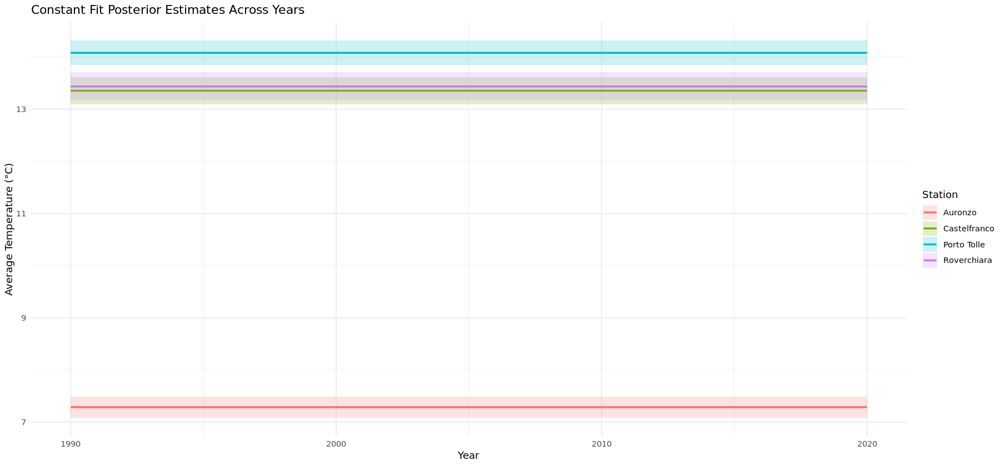

In [56]:
years <- seq(1990, 2020, by = 1)

# Build manually for plotting
df_plot <- tibble::tibble(
  Year = rep(years, 4),
  Estimate = c(
    rep(summary_A[1], length(years)),
    rep(summary_C[1], length(years)),
    rep(summary_P[1], length(years)),
    rep(summary_R[1], length(years))
  ),
  Lower = c(
    rep(summary_A[3], length(years)),
    rep(summary_C[3], length(years)),
    rep(summary_P[3], length(years)),
    rep(summary_R[3], length(years))
  ),
  Upper = c(
    rep(summary_A[4], length(years)),
    rep(summary_C[4], length(years)),
    rep(summary_P[4], length(years)),
    rep(summary_R[4], length(years))
  ),
  Station = rep(c("Auronzo", "Castelfranco", "Porto Tolle", "Roverchiara"), each = length(years))
)

ggplot(df_plot, aes(x = Year, y = Estimate, color = Station, fill = Station)) +
  geom_line(size = 1) +
  geom_ribbon(aes(ymin = Lower, ymax = Upper), alpha = 0.2, color = NA) +
  labs(
    title = "Constant Fit Posterior Estimates Across Years",
    y = "Average Temperature (°C)"
  ) +
  theme_minimal()


In [52]:
plot_constant_fit_from_brm <- function(fit_brm, df, station_name, fit_lm_const) {
  library(ggplot2)
  library(posterior)
  
  # Add predictions from lm constant model
  df$fit_const <- predict(fit_lm_const, newdata = df)
  
  # Extract posterior draws from brms fit
  post <- as_draws_df(fit_brm)
  intercept_samples <- post$b_Intercept
  
  # Summary statistics
  mean_intercept <- mean(intercept_samples)
  ci <- quantile(intercept_samples, probs = c(0.025, 0.975))
  
  # Flat line across all years
  ribbon_df <- data.frame(
    Year = unique(df$Year),
    Mean = mean_intercept,
    CI_low = ci[1],
    CI_high = ci[2]
  )
  
  # Plot
  ggplot(df, aes(x = Year, y = Avg_mean)) +
    geom_point(color = "black", size = 2, alpha = 0.7) +
    
    # Frequentist fit (constant)
    geom_line(aes(y = fit_const), color = "red", size = 3.2) +
    
    # Bayesian posterior mean + CI ribbon
    geom_line(data = ribbon_df, aes(x = Year, y = Mean), color = "blue", size = 1.2) +
    geom_ribbon(data = ribbon_df, aes(x = Year, ymin = CI_low, ymax = CI_high),
                inherit.aes = FALSE, fill = "blue", alpha = 0.2) +
    
    labs(
      title = paste("Constant Model Fit vs Data –", station_name),
      subtitle = "Red = Frequentist fit | Blue = Bayesian posterior mean (CI in shaded)",
      x = "Year",
      y = "Average Temperature (°C)"
    ) +
    theme_minimal(base_size = 14)
}


Warning message in data.frame(Year = unique(df$Year), Mean = mean_intercept, CI_low = ci[1], :
“row names were found from a short variable and have been discarded”


Warning message in data.frame(Year = unique(df$Year), Mean = mean_intercept, CI_low = ci[1], :
“row names were found from a short variable and have been discarded”


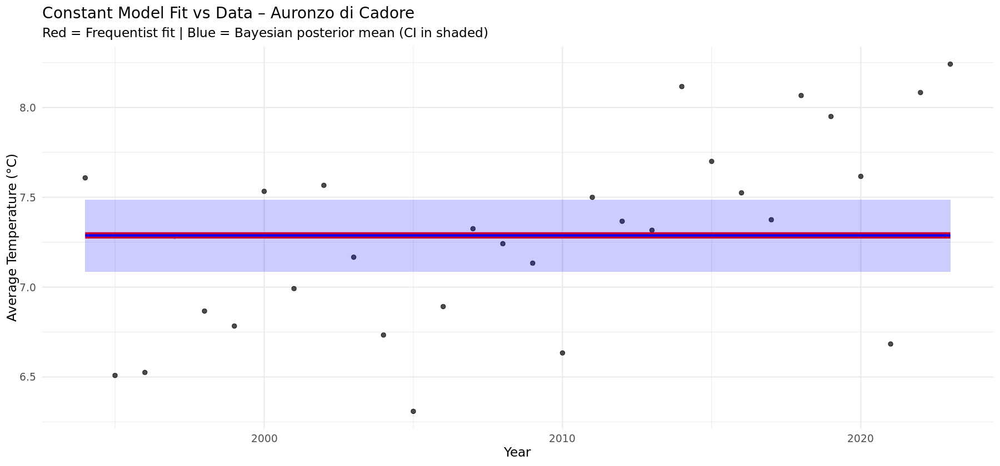

Warning message in data.frame(Year = unique(df$Year), Mean = mean_intercept, CI_low = ci[1], :
“row names were found from a short variable and have been discarded”


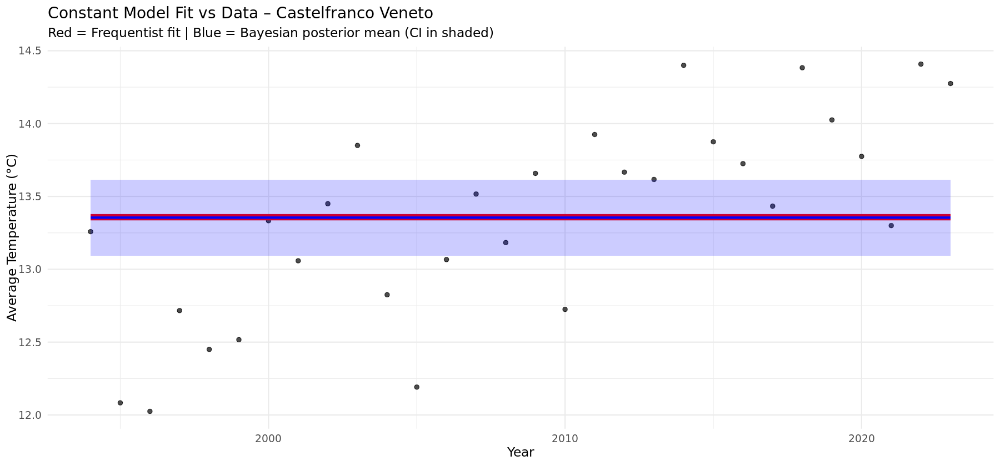

Warning message in data.frame(Year = unique(df$Year), Mean = mean_intercept, CI_low = ci[1], :
“row names were found from a short variable and have been discarded”


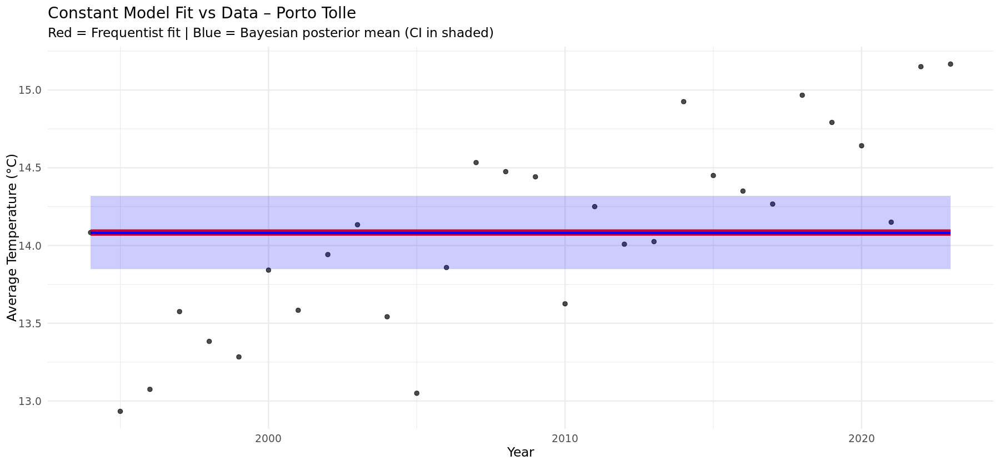

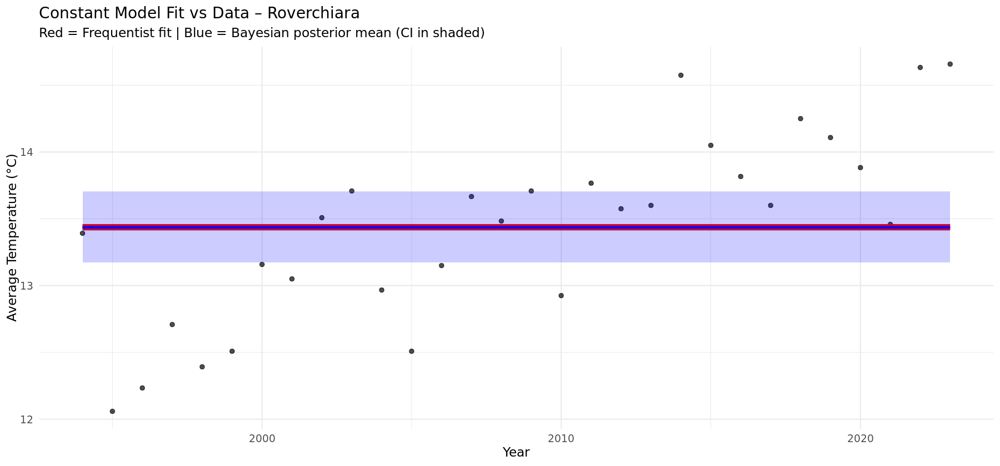

In [53]:
plot_constant_fit_from_brm(fit_constantA, A_avg, "Auronzo di Cadore", fit_constA )
plot_constant_fit_from_brm(fit_constantC, C_avg, "Castelfranco Veneto", fit_constC)
plot_constant_fit_from_brm(fit_constantP, P_avg, "Porto Tolle", fit_constP)
plot_constant_fit_from_brm(fit_constantR, R_avg, "Roverchiara", fit_constR)


In [ ]:

plot_prior_posterior_constant_model <- function(fit_constant, station_name = "Station") {
  # 1. Simulate Priors
  set.seed(123)
  prior_intercept <- rnorm(10000, mean = 0, sd = 1000)
  prior_sigma <- rcauchy(10000, location = 0, scale = 5)
  prior_sigma <- prior_sigma[prior_sigma > 0]
  
  # 2. Extract Posterior Samples
  post <- posterior::as_draws_df(fit_constant)
  
  # 3. Create Plots
  
  # Prior for Intercept
  plot_prior_intercept <- ggplot(data.frame(value = prior_intercept), aes(x = value)) +
    geom_density(fill = "skyblue", alpha = 0.6) +
    ggtitle(paste0("Prior for Intercept – ", station_name)) +
    xlab("Intercept") + ylab("Density") +
    theme_minimal(base_size = 14)
  
  # Posterior for Intercept
  plot_post_intercept <- ggplot(post, aes(x = b_Intercept)) +
    geom_density(fill = "sandybrown", alpha = 0.6) +
    ggtitle(paste0("Posterior for Intercept – ", station_name)) +
    xlab("Intercept") + ylab("Density") +
    theme_minimal(base_size = 14)
  
  # Prior for Sigma
  plot_prior_sigma <- ggplot(data.frame(value = prior_sigma), aes(x = value)) +
    geom_density(fill = "lightgreen", alpha = 0.6) +
    xlim(0, 30) +
    ggtitle(paste0("Prior for Sigma – ", station_name)) +
    xlab("Sigma") + ylab("Density") +
    theme_minimal(base_size = 14)
  
  # Posterior for Sigma
  plot_post_sigma <- ggplot(post, aes(x = sigma)) +
    geom_density(fill = "indianred2", alpha = 0.6) +
    xlim(0, 30) +
    ggtitle(paste0("Posterior for Sigma – ", station_name)) +
    xlab("Sigma") + ylab("Density") +
    theme_minimal(base_size = 14)
  
  # 4. Arrange plots in grid
  grid.arrange(
    plot_prior_intercept, plot_post_intercept,
    plot_prior_sigma, plot_post_sigma,
    ncol = 2
  )
}


Warning message:
“Removed 545 rows containing non-finite outside the scale range
(`stat_density()`).”
Warning message:
“Removed 545 rows containing non-finite outside the scale range
(`stat_density()`).”


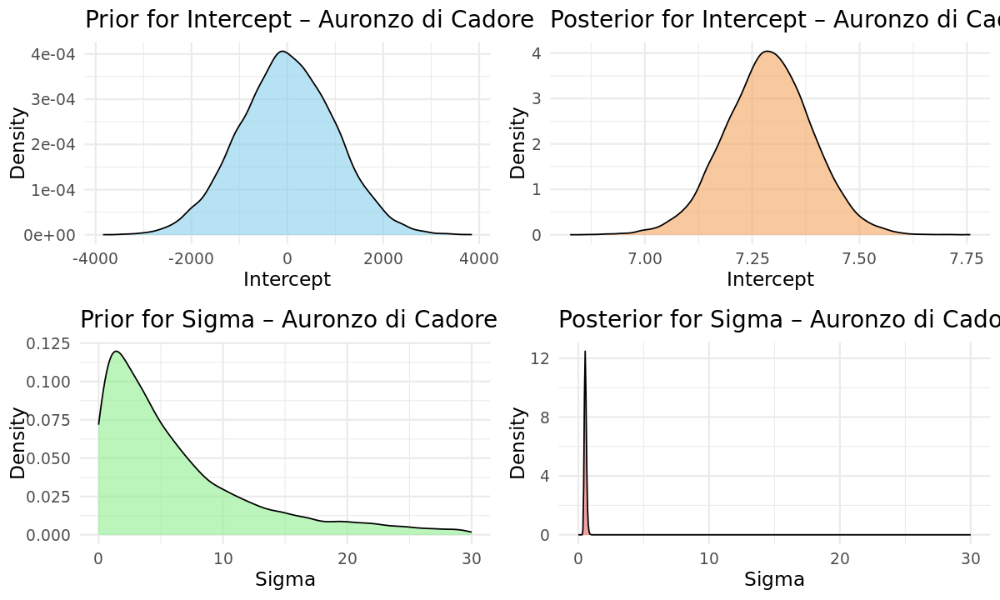

Warning message:
“Removed 545 rows containing non-finite outside the scale range
(`stat_density()`).”


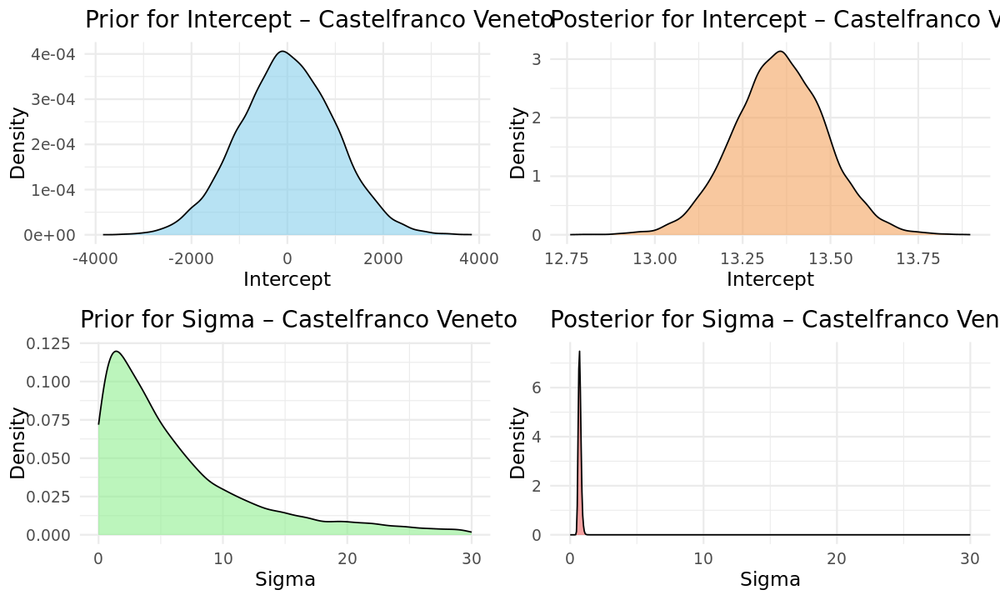

Warning message:
“Removed 545 rows containing non-finite outside the scale range
(`stat_density()`).”


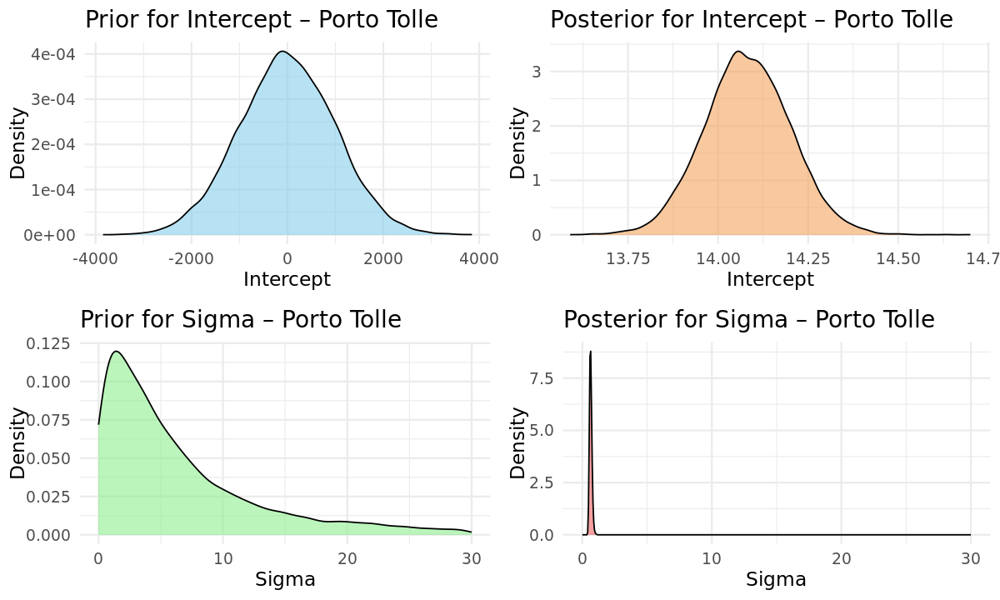

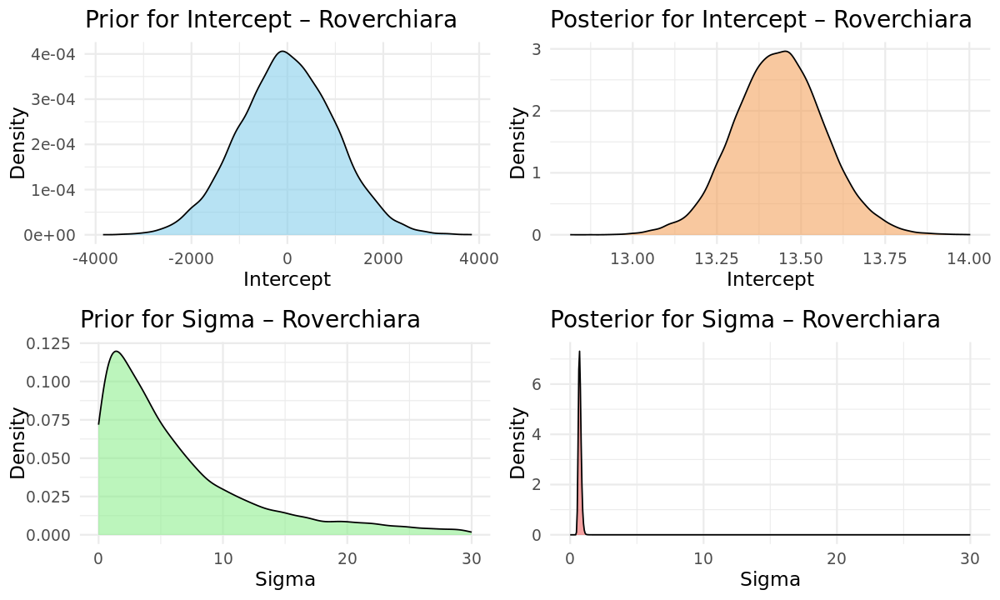

In [ ]:
plot_prior_posterior_constant_model(fit_constantA, "Auronzo di Cadore")
plot_prior_posterior_constant_model(fit_constantC, "Castelfranco Veneto")
plot_prior_posterior_constant_model(fit_constantP, "Porto Tolle")
plot_prior_posterior_constant_model(fit_constantR, "Roverchiara")


Why the Posterior of sigma Is Spiked
1. The Constant Model Forces All Variation Into sigma
In your constant model:

Avg_mean
𝑖
∼
𝑁
(
𝜇
,
𝜎
)
Avg_mean 
i
​
 ∼N(μ,σ)
where 
𝜇
μ is the same for all observations — there is no slope, no trend, just one mean.

Therefore, all the observed variation in Avg_mean over time must be explained by sigma.

If the data has relatively little variability around the mean, the posterior will sharply concentrate around the empirical standard deviation.

once data is introduced, the likelihood dominates, and the posterior collapses to a narrow peak around the actual residual standard deviation.

Since the model has no flexibility to explain trends or structure, the posterior becomes highly peaked (low uncertainty).

Suppose your data has an empirical standard deviation of around 1.05. Then the model will tightly infer:

𝜎
≈
1.05
(with very little uncertainty)
σ≈1.05(with very little uncertainty)
because:

There's no slope to absorb variation.

The model is extremely confident that this is the correct noise level given the simple structure.

It does highlight that the constant model is likely a poor fit if the data shows any time trend.

The narrowness is a sign of model inflexibility, not necessarily data certainty.

n the constant model, all the variation in the data is attributed to noise:
“All variation is just randomness around one fixed mean.”

The model must explain all data spread using only sigma.

o what does this imply about model quality? Not that the constant model is good — but that it is confident in being wrong.

A good model would instead:
Capture trends over time in the mean (with slope/curvature).

Leave sigma to explain random noise, not structured patterns.

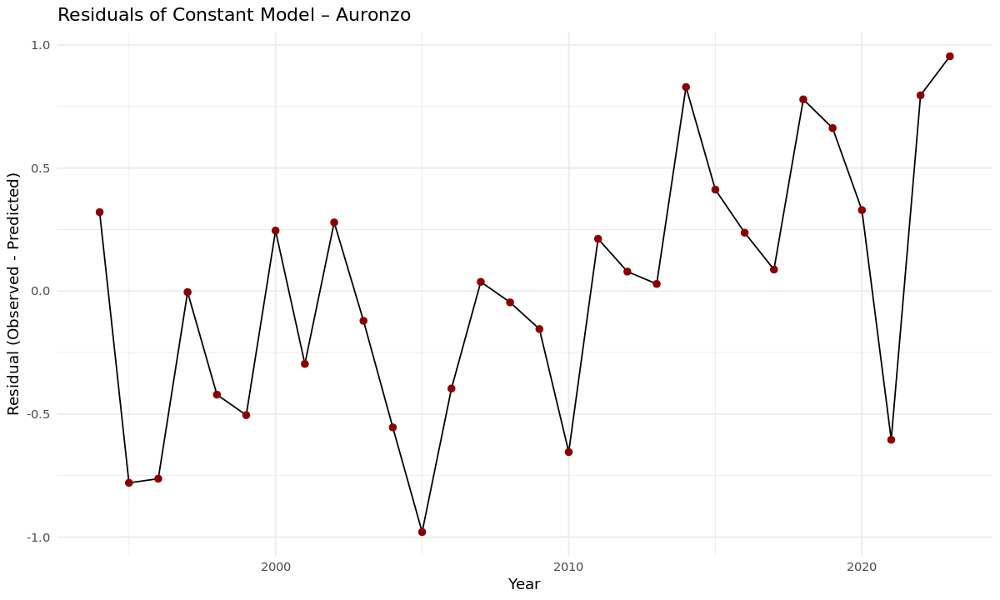

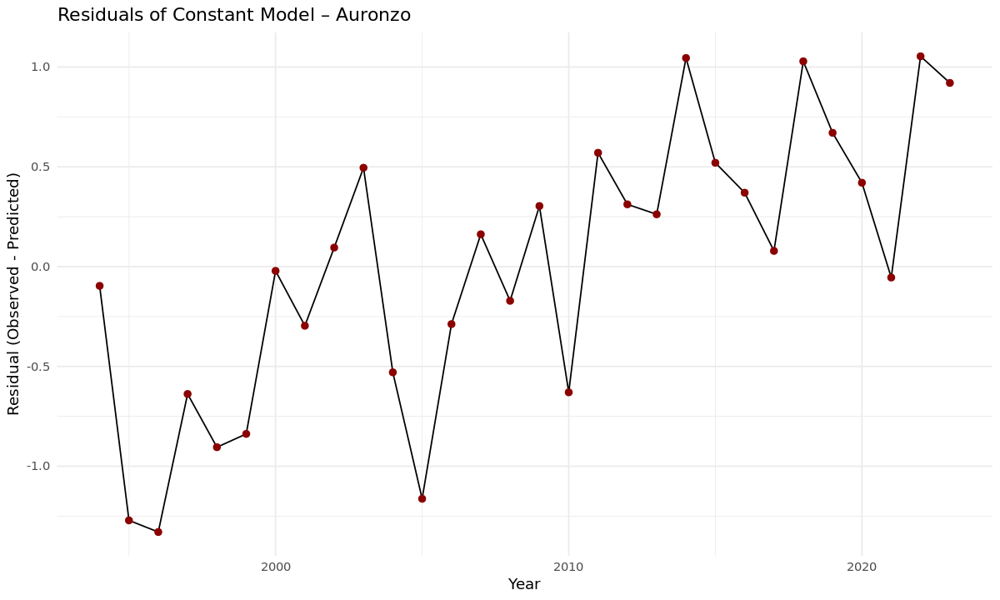

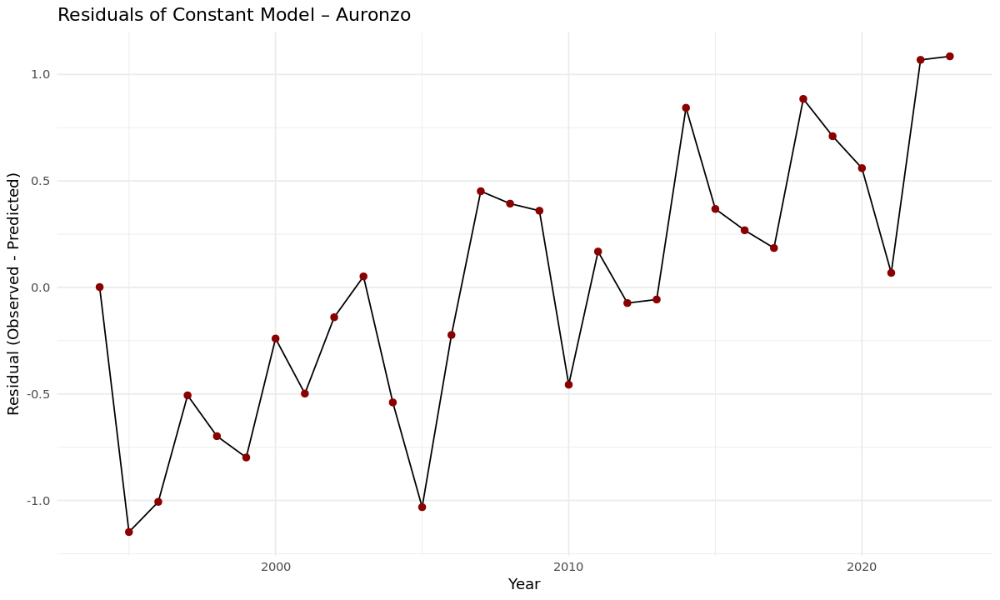

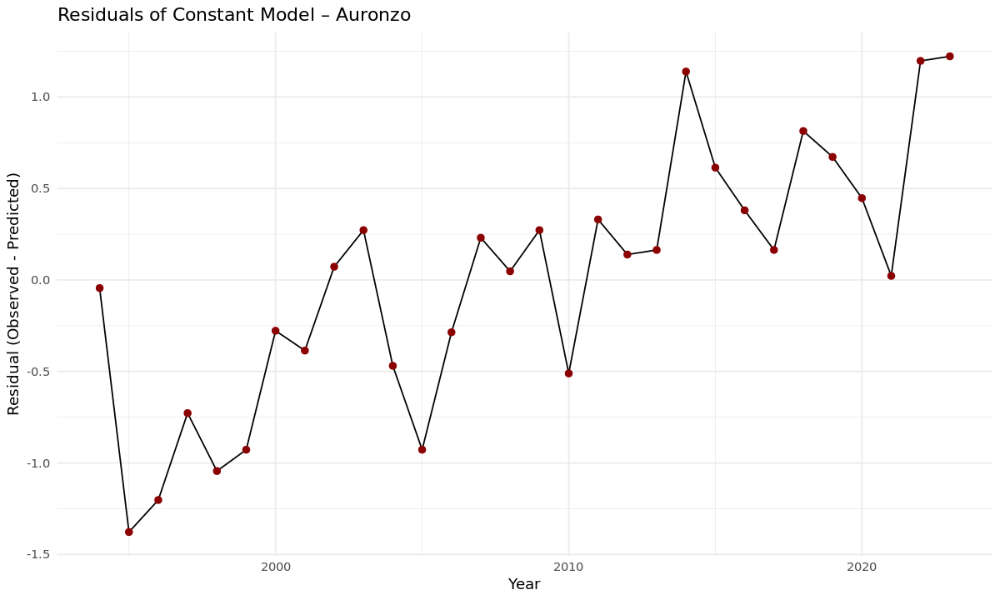

In [ ]:
# Suppose you're analyzing A_avg with fit_constantA
residuals <- A_avg$Avg_mean - fitted(fit_constantA)[, "Estimate"]

# Plot the residuals
ggplot(A_avg, aes(x = Year, y = residuals)) +
  geom_line() +
  geom_point(size = 2, color = "darkred") +
  labs(title = "Residuals of Constant Model – Auronzo",
       y = "Residual (Observed - Predicted)") +
  theme_minimal()

# Suppose you're analyzing A_avg with fit_constantA
residuals <- C_avg$Avg_mean - fitted(fit_constantC)[, "Estimate"]

# Plot the residuals
ggplot(C_avg, aes(x = Year, y = residuals)) +
  geom_line() +
  geom_point(size = 2, color = "darkred") +
  labs(title = "Residuals of Constant Model – Auronzo",
       y = "Residual (Observed - Predicted)") +
  theme_minimal()


# Suppose you're analyzing A_avg with fit_constantA
residuals <- P_avg$Avg_mean - fitted(fit_constantP)[, "Estimate"]

# Plot the residuals
ggplot(P_avg, aes(x = Year, y = residuals)) +
  geom_line() +
  geom_point(size = 2, color = "darkred") +
  labs(title = "Residuals of Constant Model – Auronzo",
       y = "Residual (Observed - Predicted)") +
  theme_minimal()


# Suppose you're analyzing A_avg with fit_constantA
residuals <- R_avg$Avg_mean - fitted(fit_constantR)[, "Estimate"]

# Plot the residuals
ggplot(R_avg, aes(x = Year, y = residuals)) +
  geom_line() +
  geom_point(size = 2, color = "darkred") +
  labs(title = "Residuals of Constant Model – Auronzo",
       y = "Residual (Observed - Predicted)") +
  theme_minimal()


In [ ]:
glimpse(A_avg)


Rows: 30
Columns: 5
$ Year     <int> 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2…
$ Min_mean <dbl> 2.2416667, 1.1416667, 1.2666667, 1.7083333, 1.2916667, 1.5833…
$ Max_mean <dbl> 14.67500, 13.45833, 13.10000, 14.53333, 14.25000, 13.76667, 1…
$ Avg_mean <dbl> 7.608333, 6.508333, 6.525000, 7.283333, 6.866667, 6.783333, 7…
$ Station  <chr> "Auronzo", "Auronzo", "Auronzo", "Auronzo", "Auronzo", "Auron…


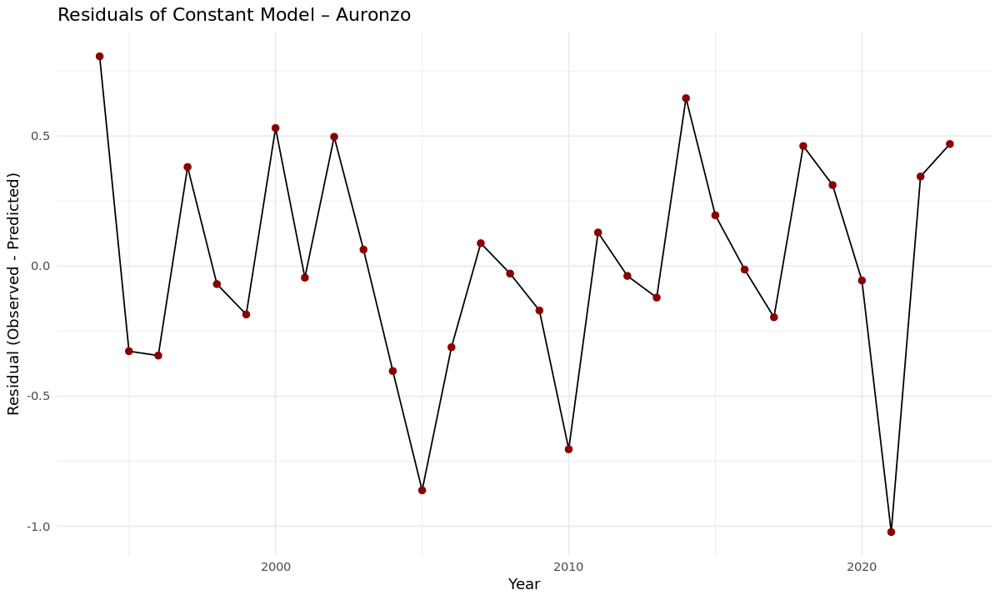

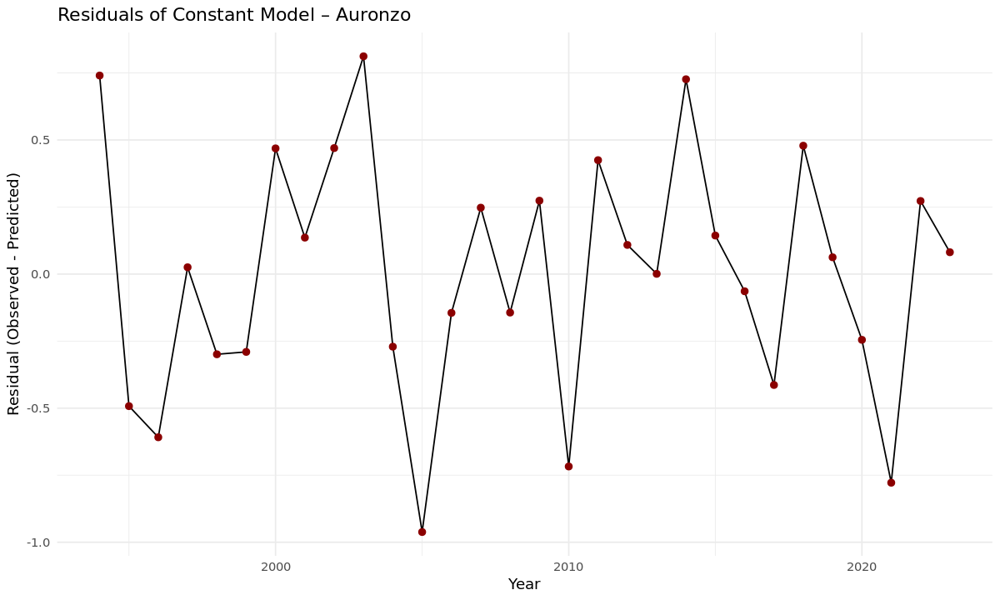

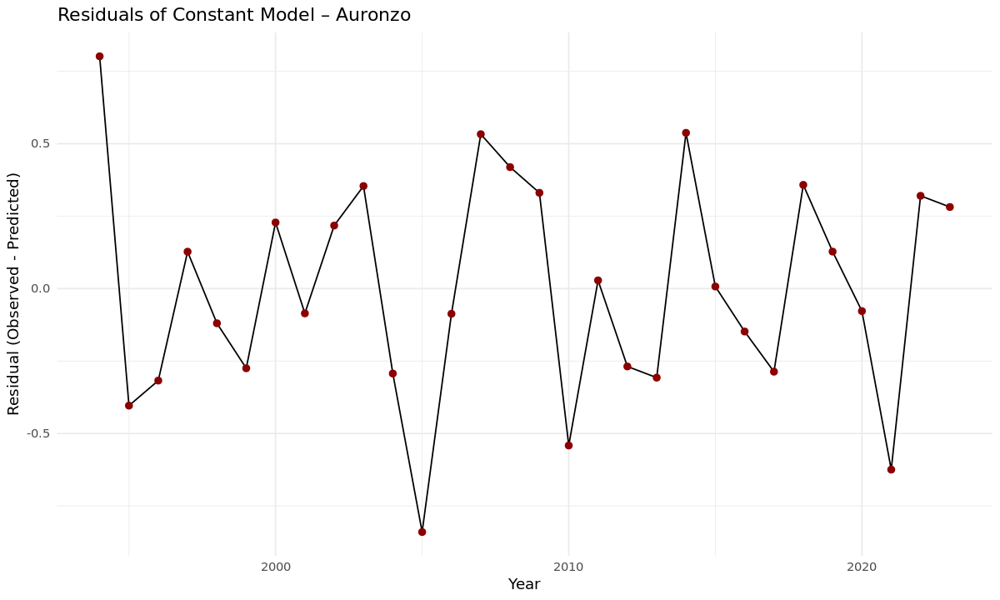

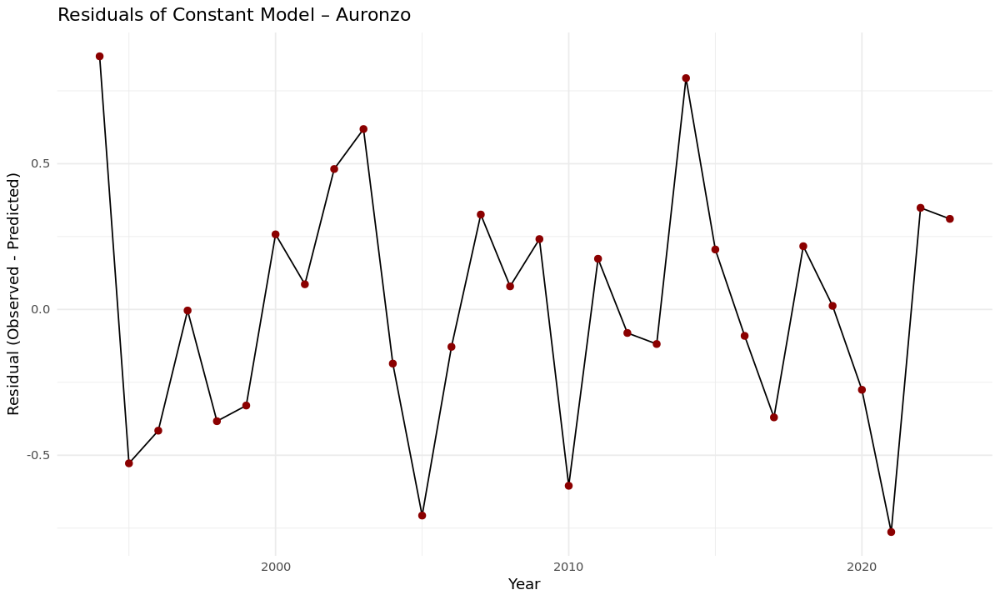

In [40]:
# Suppose you're analyzing A_avg with fit_constantA
residuals <- A_avg$Avg_mean - fitted(fit_linearA)[, "Estimate"]

# Plot the residuals
ggplot(A_avg, aes(x = Year, y = residuals)) +
  geom_line() +
  geom_point(size = 2, color = "darkred") +
  labs(title = "Residuals of Constant Model – Auronzo",
       y = "Residual (Observed - Predicted)") +
  theme_minimal()

# Suppose you're analyzing A_avg with fit_constantA
residuals <- C_avg$Avg_mean - fitted(fit_linearC)[, "Estimate"]

# Plot the residuals
ggplot(C_avg, aes(x = Year, y = residuals)) +
  geom_line() +
  geom_point(size = 2, color = "darkred") +
  labs(title = "Residuals of Constant Model – Auronzo",
       y = "Residual (Observed - Predicted)") +
  theme_minimal()


# Suppose you're analyzing A_avg with fit_constantA
residuals <- P_avg$Avg_mean - fitted(fit_linearP)[, "Estimate"]

# Plot the residuals
ggplot(P_avg, aes(x = Year, y = residuals)) +
  geom_line() +
  geom_point(size = 2, color = "darkred") +
  labs(title = "Residuals of Constant Model – Auronzo",
       y = "Residual (Observed - Predicted)") +
  theme_minimal()


# Suppose you're analyzing A_avg with fit_constantA
residuals <- R_avg$Avg_mean - fitted(fit_linearR)[, "Estimate"]

# Plot the residuals
ggplot(R_avg, aes(x = Year, y = residuals)) +
  geom_line() +
  geom_point(size = 2, color = "darkred") +
  labs(title = "Residuals of Constant Model – Auronzo",
       y = "Residual (Observed - Predicted)") +
  theme_minimal()


## Hypothesys Testing:


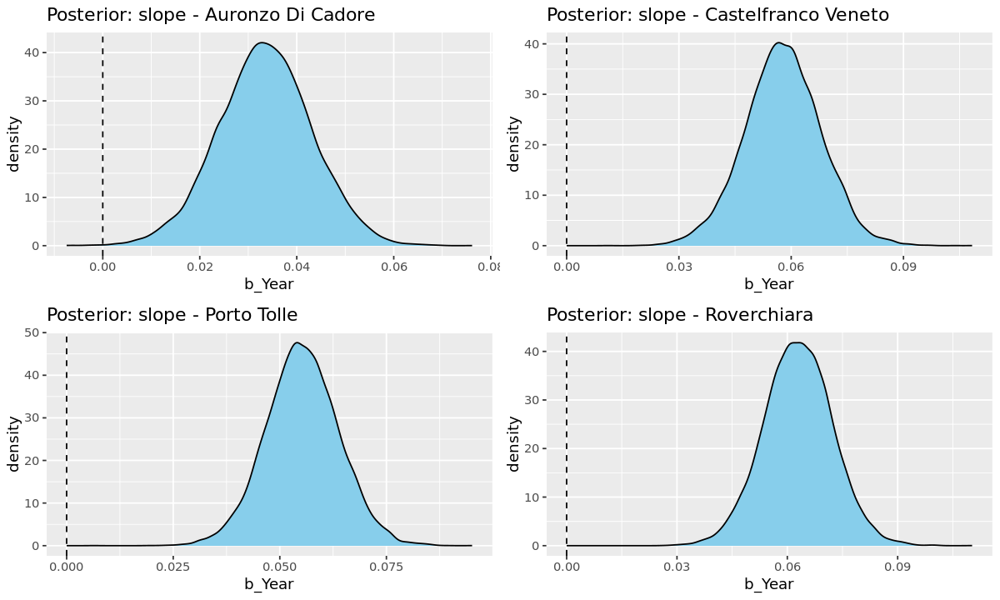

In [ ]:
# perhaps, The posterior for the slope (b_Year) includes 0, so there's not strong support for an actual trend.
# If it hugs zero, then the data don’t strongly support a trend under this prior. If it’s clearly away from zero, then the data do support it — and the prior is likely the issue.

 postA <- as_draws_df(fit_linearA)
p1 <- ggplot(postA, aes(x =b_Year)) +
  geom_density(fill = "skyblue") +
  geom_vline(xintercept = 0, linetype = "dashed")+
  ggtitle("Posterior: slope - Auronzo Di Cadore") 


 postC <- as_draws_df(fit_linearC)
p2 <- ggplot(postC, aes(x = b_Year)) +
  geom_density(fill = "skyblue") +
  geom_vline(xintercept = 0, linetype = "dashed")+
  ggtitle("Posterior: slope - Castelfranco Veneto") 


 postP <- as_draws_df(fit_linearP)
p3 <- ggplot(postP, aes(x = b_Year)) +
  geom_density(fill = "skyblue") +
  geom_vline(xintercept = 0, linetype = "dashed")+
  ggtitle("Posterior: slope - Porto Tolle") 



 postR <- as_draws_df(fit_linearR)
p4 <- ggplot(postR, aes(x = b_Year)) +
  geom_density(fill = "skyblue") +
  geom_vline(xintercept = 0, linetype = "dashed")+
  ggtitle("Posterior: slope - Roverchiara") 


grid.arrange(p1, p2, p3, p4, ncol = 2)


In [ ]:
bayesian_trend_test <- function(fit_linear, station_name = "Station") {
  # Ensure posterior package is available
  if (!requireNamespace("posterior", quietly = TRUE)) {
    stop("Please install the 'posterior' package.")
  }

  # Extract posterior samples
  post <- posterior::as_draws_df(fit_linear)

  # Compute posterior probabilities
  prob_b_greater_0 <- mean(post$b_Year > 0)
  prob_b_less_equal_0 <- 1 - prob_b_greater_0

  # Report
  cat("\n------------------------------------------------------------\n")
  cat("Bayesian Hypothesis Test for Linear Trend at", station_name, "\n")
  cat("------------------------------------------------------------\n")
  cat("H₀: Slope ≤ 0 (no increasing trend)\n")
  cat("H₁: Slope > 0 (increasing trend)\n\n")
  cat("P(b > 0 | data) =", round(prob_b_greater_0, 4), "\n")
  cat("P(b ≤ 0 | data) =", round(prob_b_less_equal_0, 4), "\n")

  # Conclusion
  if (prob_b_greater_0 > 0.95) {
    cat("Conclusion: Strong evidence for an increasing trend (H₁)\n")
  } else if (prob_b_greater_0 > 0.9) {
    cat("Conclusion:  Moderate evidence for an increasing trend (H₁)\n")
  } else if (prob_b_greater_0 > 0.75) {
    cat("Conclusion: Weak evidence for an increasing trend (H₁)\n")
  } else {
    cat("Conclusion: No strong evidence for an increasing trend\n")
  }
  cat("------------------------------------------------------------\n")
}


In [ ]:
bayesian_trend_test(fit_linearA, "Auronzo di Cadore")
bayesian_trend_test(fit_linearC, "Castelfranco Veneto")
bayesian_trend_test(fit_linearP, "Porto Tolle")
bayesian_trend_test(fit_linearR, "Roverchiara")



------------------------------------------------------------
Bayesian Hypothesis Test for Linear Trend at Auronzo di Cadore 
------------------------------------------------------------
H₀: Slope ≤ 0 (no increasing trend)
H₁: Slope > 0 (increasing trend)

P(b > 0 | data) = 0.9992 
P(b ≤ 0 | data) = 8e-04 
Conclusion: Strong evidence for an increasing trend (H₁)
------------------------------------------------------------

------------------------------------------------------------
Bayesian Hypothesis Test for Linear Trend at Castelfranco Veneto 
------------------------------------------------------------
H₀: Slope ≤ 0 (no increasing trend)
H₁: Slope > 0 (increasing trend)

P(b > 0 | data) = 1 
P(b ≤ 0 | data) = 0 
Conclusion: Strong evidence for an increasing trend (H₁)
------------------------------------------------------------

------------------------------------------------------------
Bayesian Hypothesis Test for Linear Trend at Porto Tolle 
-----------------------------------

• do you see correlations between data measured at different stations ?


First we study and visualize the correlation between the initial data measured for each station.

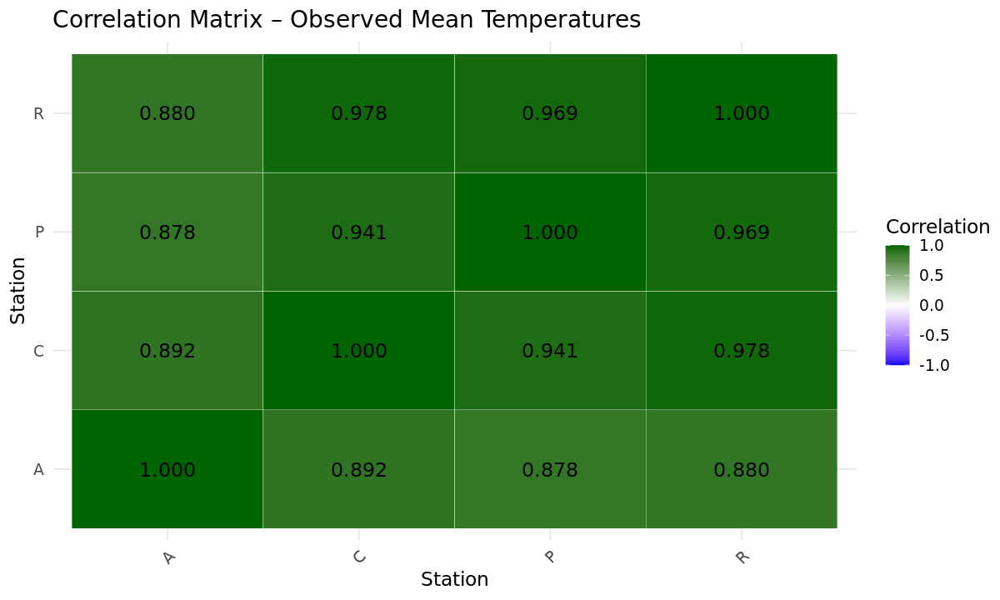

In [ ]:
# Versione corretta basata su dati osservati
obs_df <- data.frame(
  Year = A_avg$Year,
  A = A_avg$Avg_mean,
  C = C_avg$Avg_mean,
  P = P_avg$Avg_mean,
  R = R_avg$Avg_mean
)

cor_matrix <- cor(obs_df[, -1])  # Questa matrice sarà meno "perfetta"

# 2. Melt it into long format for plotting
cor_long <- melt(cor_matrix)

# 3. Plot with ggplot
ggplot(cor_long, aes(x = Var1, y = Var2, fill = value)) +
  geom_tile(color = "white") +
  scale_fill_gradient2(
    low = "red", high = "darkgreen", mid = "white", 
    midpoint = 0, limit = c(-1, 1), 
    name = "Correlation"
  ) +
  geom_text(aes(label = sprintf("%.3f", value)), color = "black", size = 5) +
  theme_minimal(base_size = 14) +
  labs(
    title = "Correlation Matrix – Observed Mean Temperatures",
    x = "Station", y = "Station"
  ) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))


To complete the analysis is necessary to study the correlation between the predicted annual temperatures obtained from the linear models fitted to each station. What we are visualizing here is the correlation matrix of the, fitted values, the mean predictions for each month-year from each station's linear model.

These correlations reflect how similarly the predicted temperatures evolve over time across stations. Interestingly, this correlation is higher than that observed in the original temperature data, which is likely due to the smoothing effect of the linear models. By removing short-term fluctuations and capturing only the long-term trend (i.e., the slope), the models reduce local noise and amplify shared temporal patterns. This results in predicted values that vary in a more synchronized way across stations, even if the raw data was more scattered.



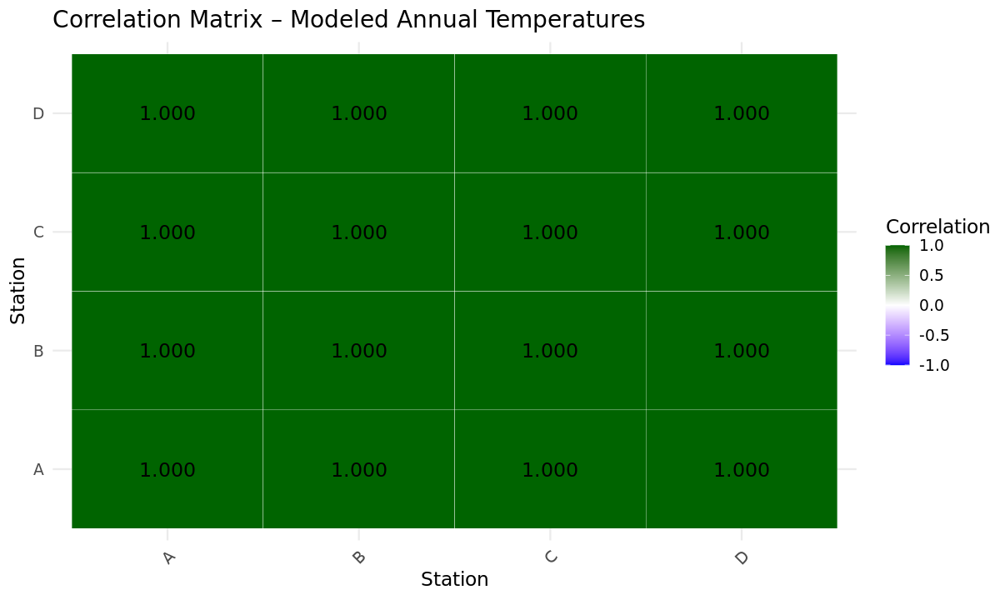

In [ ]:
# Assuming same years for all stations
years <- A$Year

fitted_df <- data.frame(
  Year = years,
  A = fitted(fit_linearA)[, "Estimate"],
  B = fitted(fit_linearC)[, "Estimate"],
  C = fitted(fit_linearP)[, "Estimate"],
  D = fitted(fit_linearR)[, "Estimate"]
)

cor_matrix_fitted <- cor(fitted_df[, -1])  # Correlation of modeled annual temperatures

# 2. Melt it into long format
cor_long_fitted <- melt(cor_matrix_fitted)

# 3. Create heatmap plot
ggplot(cor_long_fitted, aes(x = Var1, y = Var2, fill = value)) +
  geom_tile(color = "white") +
  scale_fill_gradient2(
    low = "blue", high = "darkgreen", mid = "white",
    midpoint = 0, limit = c(-1, 1),
    name = "Correlation"
  ) +
  geom_text(aes(label = sprintf("%.3f", value)), color = "black", size = 5) +
  theme_minimal(base_size = 14) +
  labs(
    title = "Correlation Matrix – Modeled Annual Temperatures",
    x = "Station", y = "Station"
  ) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))


In the following we can also study the correlation matrix between the uncertainities of the slopes calculated for the various stations.

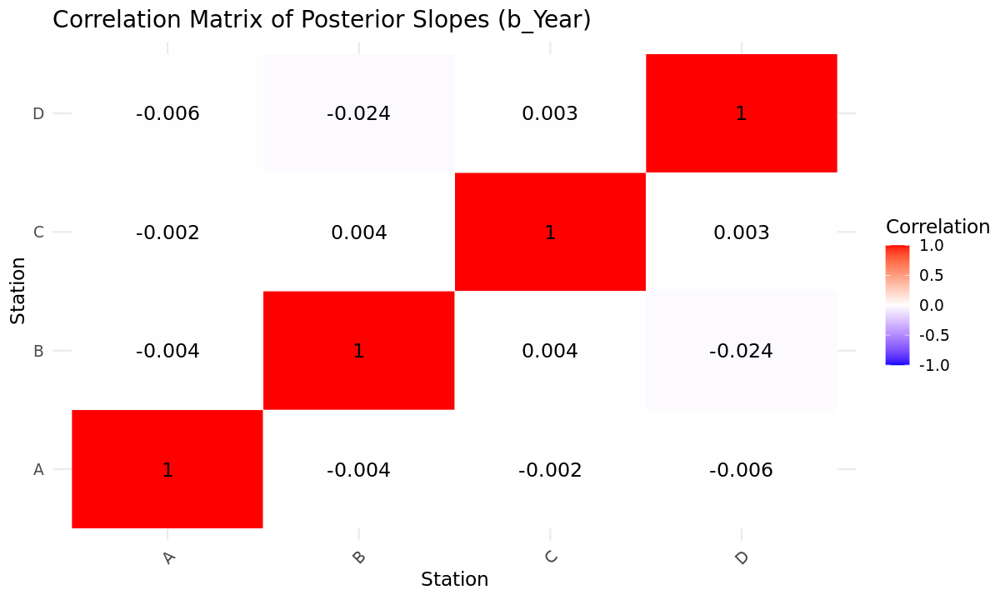

In [ ]:
# Extract posterior slope draws from each model
slope_A <- as_draws_df(fit_linearA)$b_Year
slope_B <- as_draws_df(fit_linearC)$b_Year
slope_C <- as_draws_df(fit_linearP)$b_Year
slope_D <- as_draws_df(fit_linearR)$b_Year

# Combine into one dataframe
slopes_df <- data.frame(A = slope_A, B = slope_B, C = slope_C, D = slope_D)

# Compute correlation matrix between posterior samples of slopes
cor_matrix <- cor(slopes_df)

# Prepare data for ggplot
cor_long <- melt(cor_matrix)

# Plot heatmap of correlation matrix
ggplot(cor_long, aes(x = Var1, y = Var2, fill = value)) +
  geom_tile(color = "white") +
  scale_fill_gradient2(
    low = "blue", mid = "white", high = "red",
    midpoint = 0, limit = c(-1, 1),
    name = "Correlation"
  ) +
  geom_text(aes(label = round(value, 3)), color = "black", size = 5) +
  theme_minimal(base_size = 14) +
  labs(
    title = "Correlation Matrix of Posterior Slopes (b_Year)",
    x = "Station",
    y = "Station"
  ) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))


In [ ]:
glimpse(slopes_df)


Rows: 16,000
Columns: 4
$ A <dbl> 0.03529084, 0.03306290, 0.03484387, 0.03458027, 0.04964545, 0.020213…
$ B <dbl> 0.05153010, 0.05064566, 0.05691784, 0.04902211, 0.05169977, 0.050643…
$ C <dbl> 0.05558193, 0.04138081, 0.06827824, 0.05241303, 0.05715874, 0.054972…
$ D <dbl> 0.07330481, 0.07720777, 0.04748374, 0.07010826, 0.05586764, 0.065358…


To actually calculate the correlation between the values of the slope you should have multiple calculation of the parameters for the same station. Since we only have one set of datas for each station and hence only one parameter estimation we cannot calculate the correlation between the slopes of different stations.

In [ ]:
# Extract posterior means for slopes (b_Year) from each fit
mean_slope_A <- mean(as_draws_df(fit_linearA)$b_Year)
mean_slope_B <- mean(as_draws_df(fit_linearC)$b_Year)
mean_slope_C <- mean(as_draws_df(fit_linearP)$b_Year)
mean_slope_D <- mean(as_draws_df(fit_linearR)$b_Year)

# Put into a vector or dataframe
mean_slopes <- c(A = mean_slope_A, B = mean_slope_B, C = mean_slope_C, D = mean_slope_D)

# Since this is only 4 values, a correlation matrix doesn't quite make sense
# But you could look at pairwise correlations if you had more stations or years
print(mean_slopes)


         A          B          C          D 
0.03346352 0.05777800 0.05528640 0.06290794 
